In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [46]:
df = pd.read_csv('/Users/devulapellykushalkumarreddy/Desktop/Agriculture/TG_AP_CropData.csv')
df.head()


,Dist Code,Year,State Code,State Name,Dist Name,RICE AREA (1000 ha),RICE PRODUCTION (1000 tons),RICE YIELD (Kg per ha),WHEAT AREA (1000 ha),WHEAT PRODUCTION (1000 tons),...,SUGARCANE YIELD (Kg per ha),COTTON AREA (1000 ha),COTTON PRODUCTION (1000 tons),COTTON YIELD (Kg per ha),FRUITS AREA (1000 ha),VEGETABLES AREA (1000 ha),FRUITS AND VEGETABLES AREA (1000 ha),POTATOES AREA (1000 ha),ONION AREA (1000 ha),FODDER AREA (1000 ha)
0,44,1966,1,Andhra Pradesh,Srikakulam,279.0,226.0,810.04,0.0,0.0,...,6288.14,0.0,0.0,0.0,13.53,2.48,16.01,0.00,0.40,0.87
1,44,1967,1,Andhra Pradesh,Srikakulam,277.0,193.0,696.75,0.0,0.0,...,5827.59,0.0,0.0,0.0,13.25,3.12,16.37,0.00,0.40,0.29
2,44,1968,1,Andhra Pradesh,Srikakulam,305.3,172.0,563.38,0.0,0.0,...,7101.12,0.0,0.0,0.0,14.14,3.04,17.18,0.00,0.45,0.19
3,44,1969,1,Andhra Pradesh,Srikakulam,266.3,229.7,862.56,0.0,0.0,...,6287.04,0.0,0.0,0.0,12.58,2.56,15.14,0.01,0.26,0.03
4,44,1970,1,Andhra Pradesh,Srikakulam,281.1,297.9,1059.77,0.0,0.0,...,6556.96,0.0,0.0,0.0,14.61,2.69,17.30,0.00,0.33,0.02


In [47]:
df.info()

df.describe()

df.columns


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1040 entries, 0 to 1039
Data columns (total 80 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Dist Code                                    1040 non-null   int64  
 1   Year                                         1040 non-null   int64  
 2   State Code                                   1040 non-null   int64  
 3   State Name                                   1040 non-null   object 
 4   Dist Name                                    1040 non-null   object 
 5   RICE AREA (1000 ha)                          1040 non-null   float64
 6   RICE PRODUCTION (1000 tons)                  1040 non-null   float64
 7   RICE YIELD (Kg per ha)                       1040 non-null   float64
 8   WHEAT AREA (1000 ha)                         1040 non-null   float64
 9   WHEAT PRODUCTION (1000 tons)                 1040 non-null   float64
 10  

Index(['Dist Code', 'Year', 'State Code', 'State Name', 'Dist Name',
       'RICE AREA (1000 ha)', 'RICE PRODUCTION (1000 tons)',
       'RICE YIELD (Kg per ha)', 'WHEAT AREA (1000 ha)',
       'WHEAT PRODUCTION (1000 tons)', 'WHEAT YIELD (Kg per ha)',
       'KHARIF SORGHUM AREA (1000 ha)',
       'KHARIF SORGHUM PRODUCTION (1000 tons)',
       'KHARIF SORGHUM YIELD (Kg per ha)', 'RABI SORGHUM AREA (1000 ha)',
       'RABI SORGHUM PRODUCTION (1000 tons)', 'RABI SORGHUM YIELD (Kg per ha)',
       'SORGHUM AREA (1000 ha)', 'SORGHUM PRODUCTION (1000 tons)',
       'SORGHUM YIELD (Kg per ha)', 'PEARL MILLET AREA (1000 ha)',
       'PEARL MILLET PRODUCTION (1000 tons)', 'PEARL MILLET YIELD (Kg per ha)',
       'MAIZE AREA (1000 ha)', 'MAIZE PRODUCTION (1000 tons)',
       'MAIZE YIELD (Kg per ha)', 'FINGER MILLET AREA (1000 ha)',
       'FINGER MILLET PRODUCTION (1000 tons)',
       'FINGER MILLET YIELD (Kg per ha)', 'BARLEY AREA (1000 ha)',
       'BARLEY PRODUCTION (1000 tons)', 'BARLEY 

In [48]:
df.isnull().sum()



Dist Code                               0
Year                                    0
State Code                              0
State Name                              0
Dist Name                               0
                                       ..
VEGETABLES AREA (1000 ha)               0
FRUITS AND VEGETABLES AREA (1000 ha)    0
POTATOES AREA (1000 ha)                 0
ONION AREA (1000 ha)                    0
FODDER AREA (1000 ha)                   0
Length: 80, dtype: int64

In [49]:
df.shape 
df.head() 
df.dtypes


Dist Code                                 int64
Year                                      int64
State Code                                int64
State Name                               object
Dist Name                                object
                                         ...   
VEGETABLES AREA (1000 ha)               float64
FRUITS AND VEGETABLES AREA (1000 ha)    float64
POTATOES AREA (1000 ha)                 float64
ONION AREA (1000 ha)                    float64
FODDER AREA (1000 ha)                   float64
Length: 80, dtype: object

In [50]:
df.to_csv('TG_AP_preprocessed_dataset.csv', index=False)



In [51]:
num_rows = df.shape[0]
num_columns = df.shape[1]
period_covered = f"{df['Year'].min()} to {df['Year'].max()}"
states = df['State Name'].unique()
features = "Area (1000 ha), Production (1000 tons), Yield (kg/ha) for ~20+ crops."

summarydata = {
    "Metric": ["Rows", "Columns", "Period Covered", "States", "Features"],
    "Value": [
        num_rows,
        num_columns,
        period_covered,
        ", ".join(states),
        features
    ]
}

summary = pd.DataFrame(summarydata)

summary


,Metric,Value
0,Rows,1040
1,Columns,80
2,Period Covered,1966 to 2017
3,States,"Andhra Pradesh, Telangana"
4,Features,"Area (1000 ha), Production (1000 tons), Yield ..."


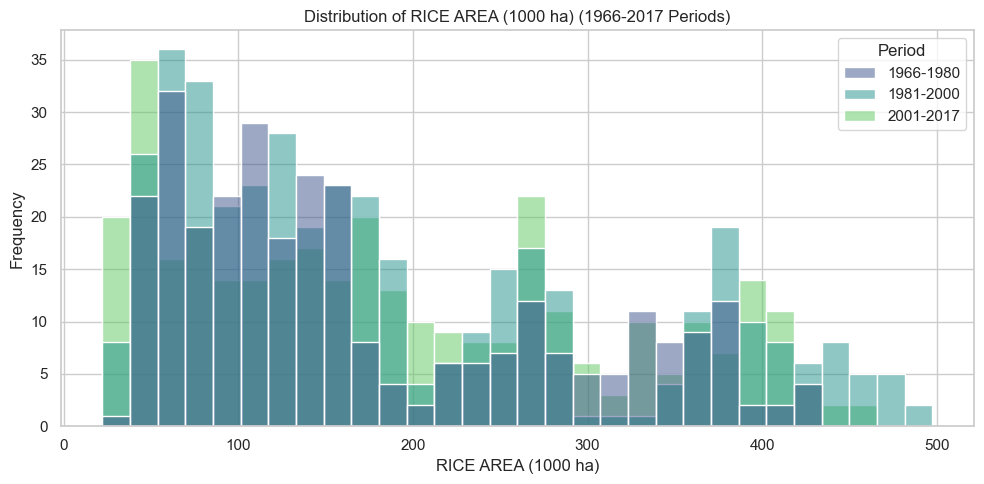

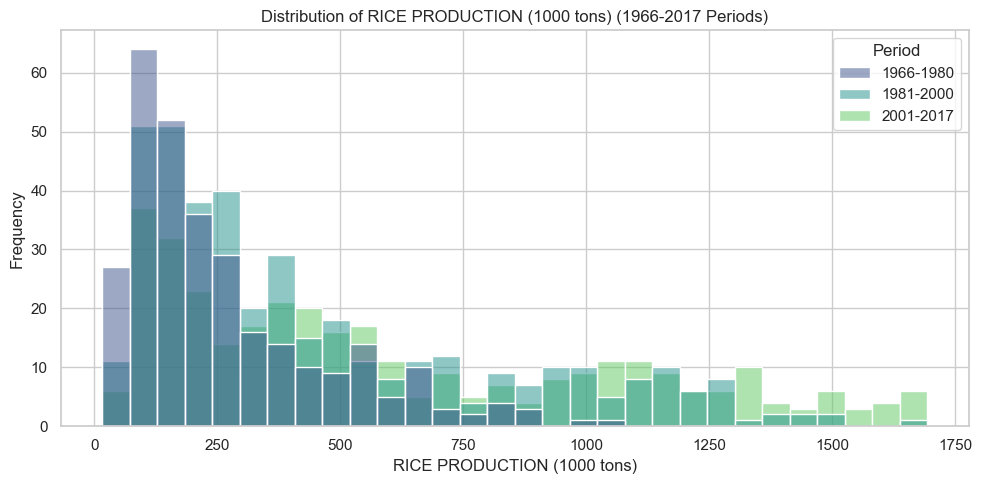

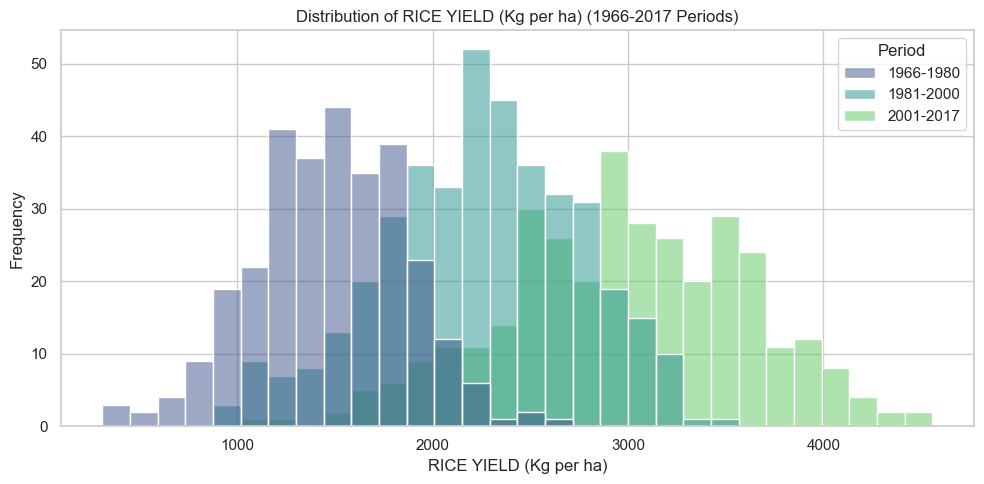

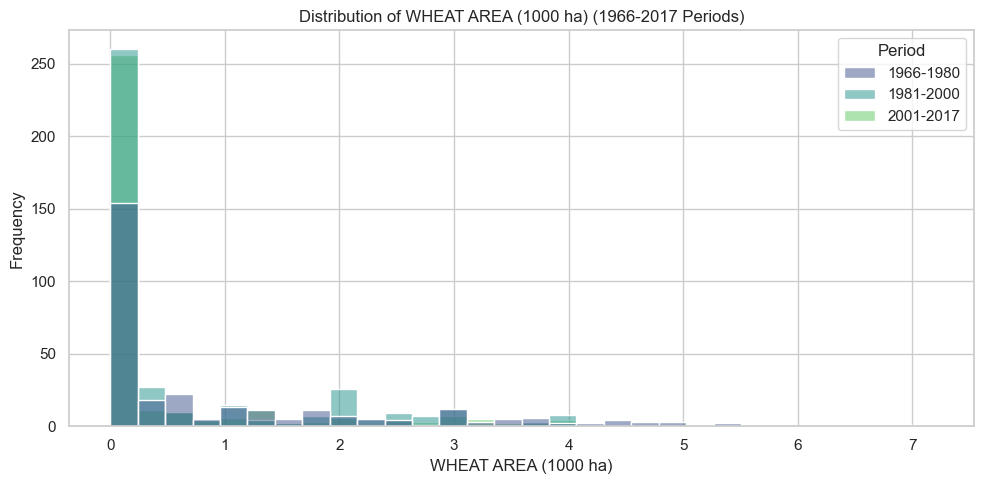

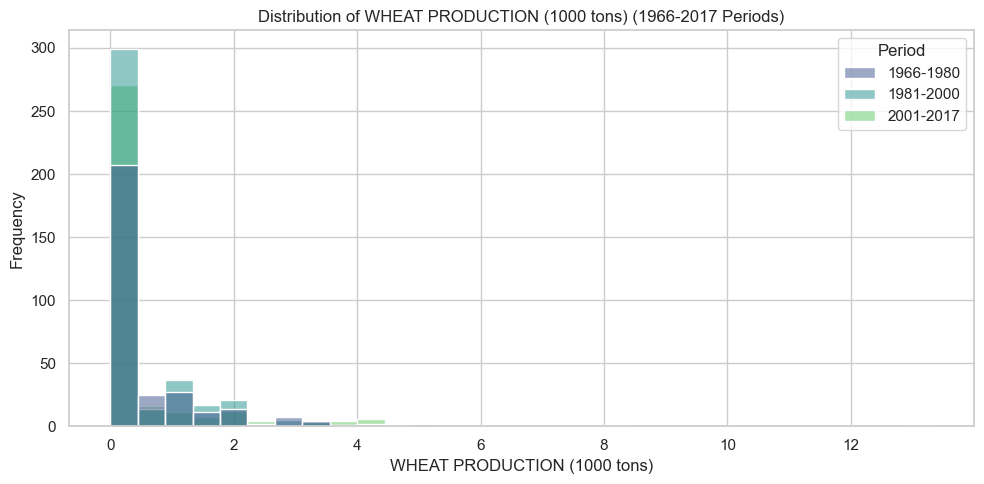

...

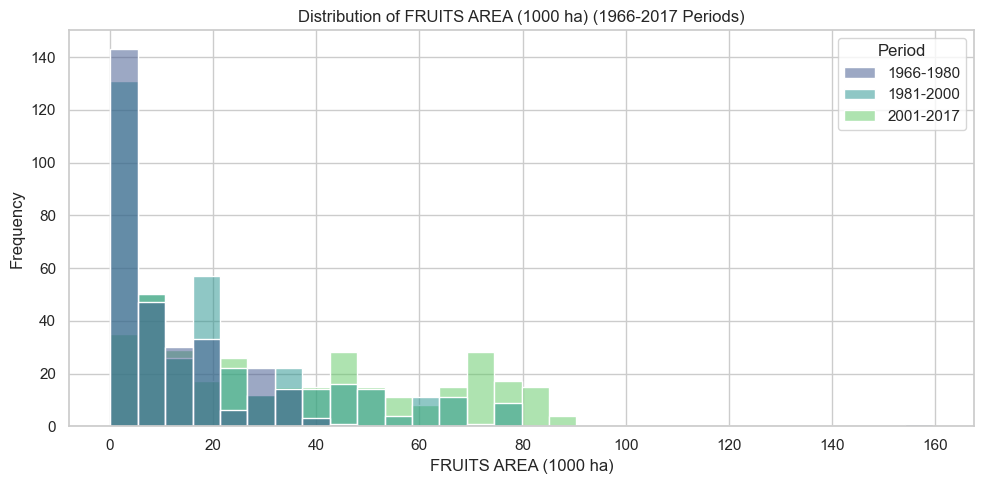

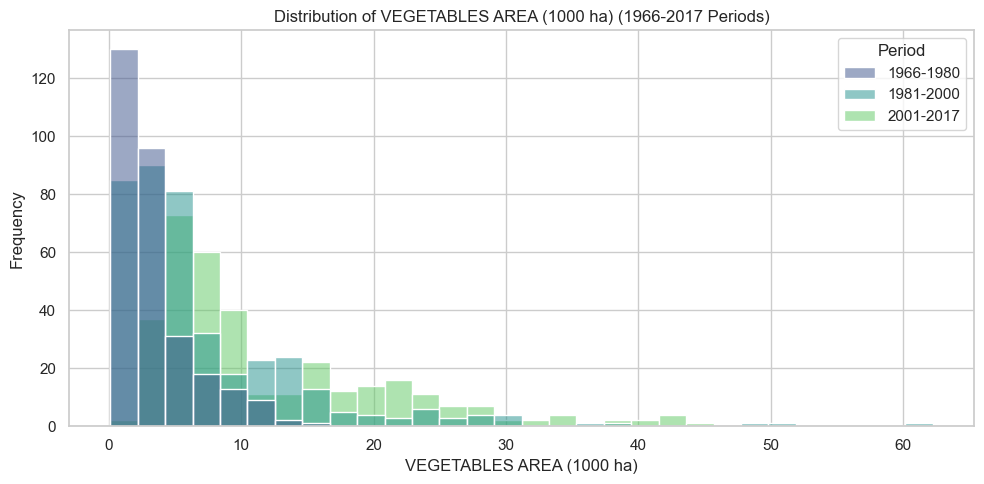

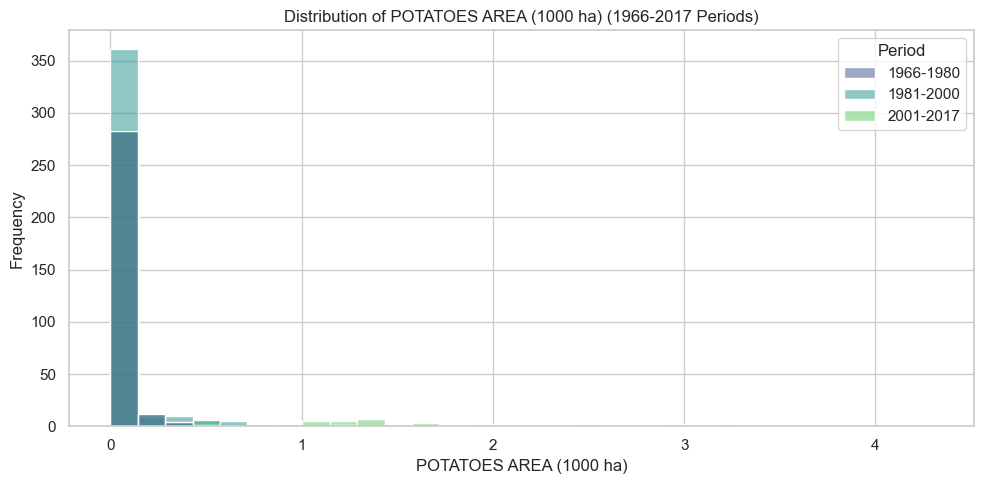

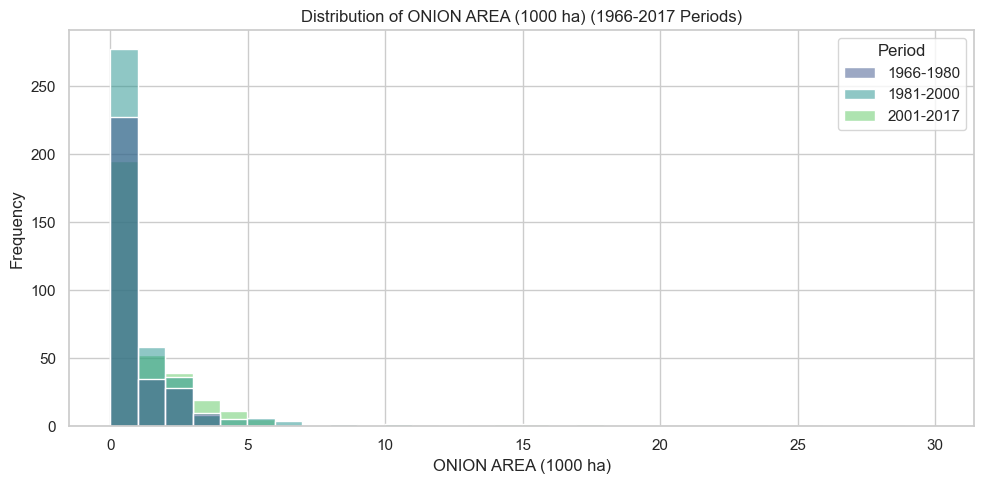

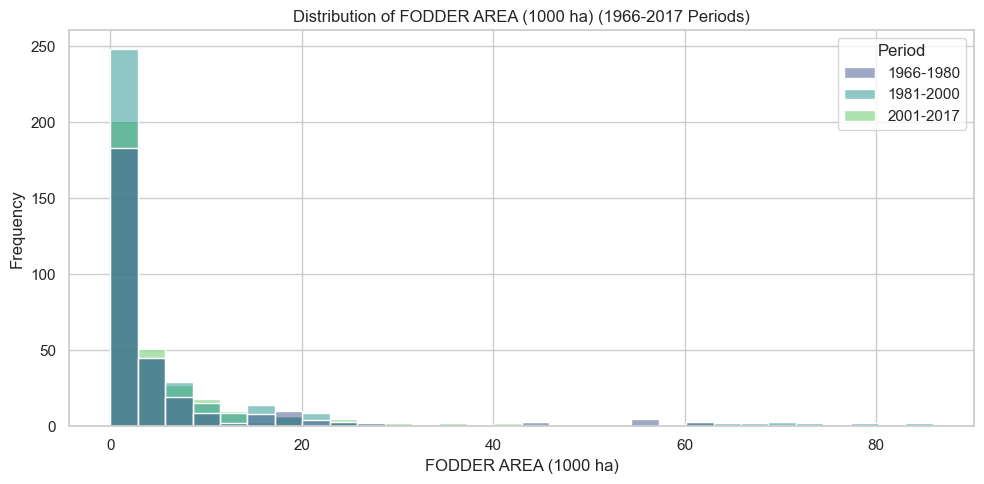

In [52]:
sns.set(style="whitegrid")

#period column
def assign_period(year):
    if 1966 <= year <= 1980:
        return '1966-1980'
    elif 1981 <= year <= 2000:
        return '1981-2000'
    elif 2001 <= year <= 2017:
        return '2001-2017'
    else:
        return 'Other'

df['Period'] = df['Year'].apply(assign_period)

main_crops = [
    'RICE', 'WHEAT', 'KHARIF SORGHUM', 'RABI SORGHUM', 'PEARL MILLET', 'MAIZE', 
    'FINGER MILLET', 'BARLEY', 'CHICKPEA', 'PIGEONPEA', 'MINOR PULSES', 
    'GROUNDNUT', 'SESAMUM', 'RAPESEED AND MUSTARD', 'SAFFLOWER', 'CASTOR', 
    'LINSEED', 'SUNFLOWER', 'SOYABEAN', 'OILSEEDS', 'SUGARCANE', 'COTTON', 
    'FRUITS', 'VEGETABLES', 'POTATOES', 'ONION', 'FODDER'
]

for crop in main_crops:
    area_col = f"{crop} AREA (1000 ha)"
    production_col = f"{crop} PRODUCTION (1000 tons)"
    yield_col = f"{crop} YIELD (Kg per ha)"
    
    for col in [area_col, production_col, yield_col]:
        if col in df.columns:
            plt.figure(figsize=(10, 5))
            sns.histplot(data=df, x=col, hue='Period', bins=30, palette='viridis')  # Removed kde=True
            plt.title(f'Distribution of {col} (1966-2017 Periods)')
            plt.xlabel(col)
            plt.ylabel('Frequency')
            plt.grid(True)
            plt.tight_layout()
            plt.show()

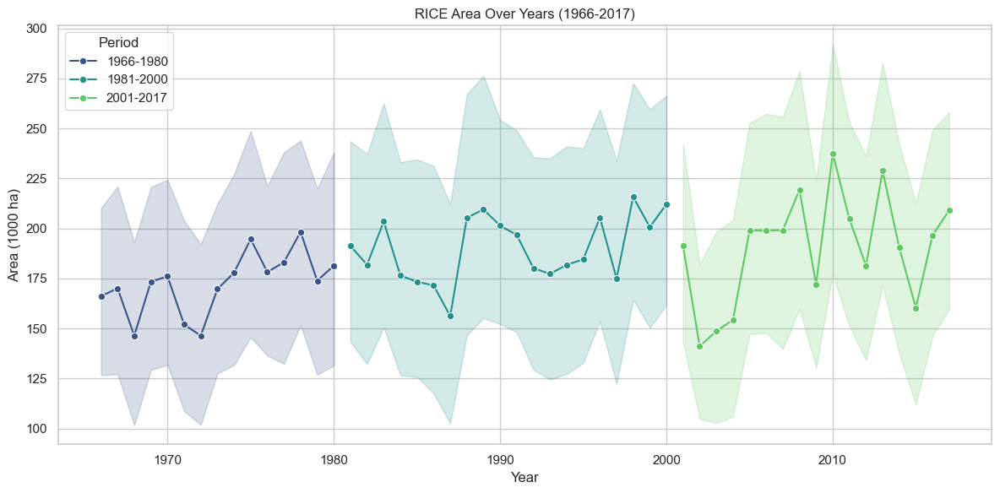

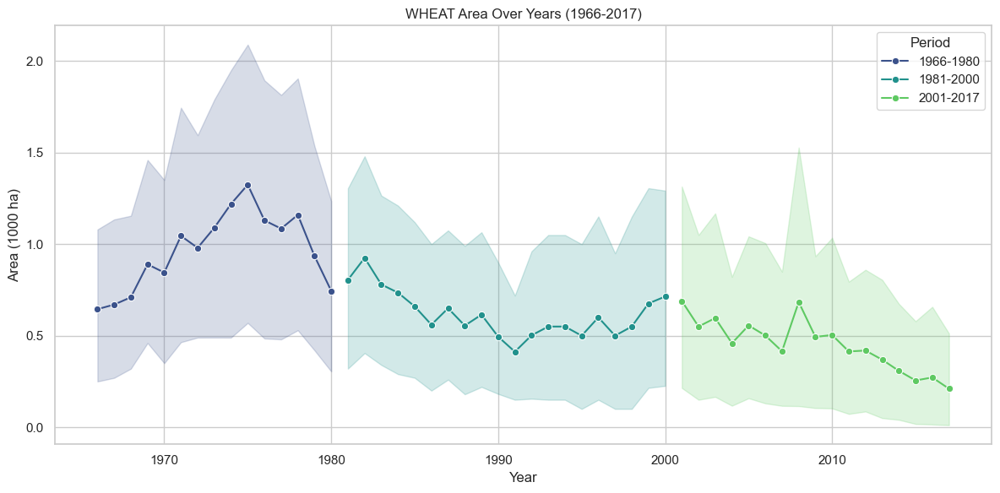

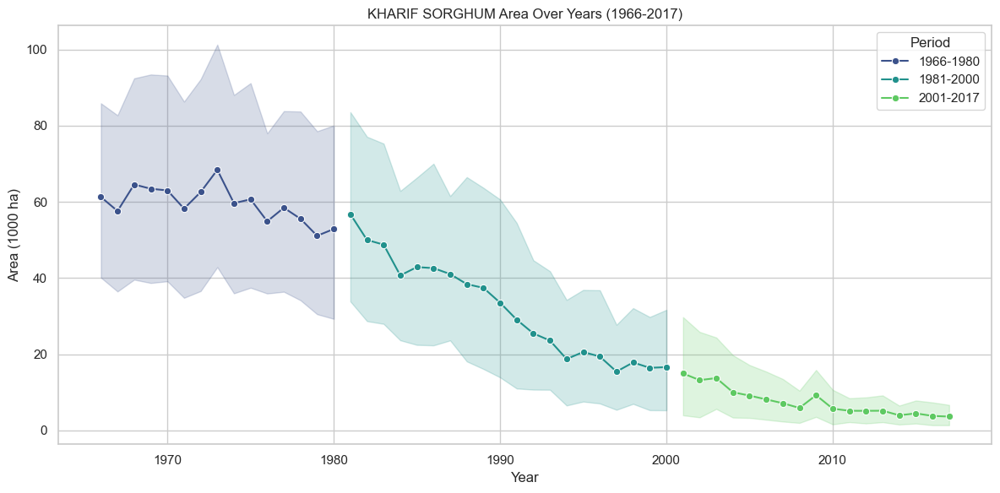

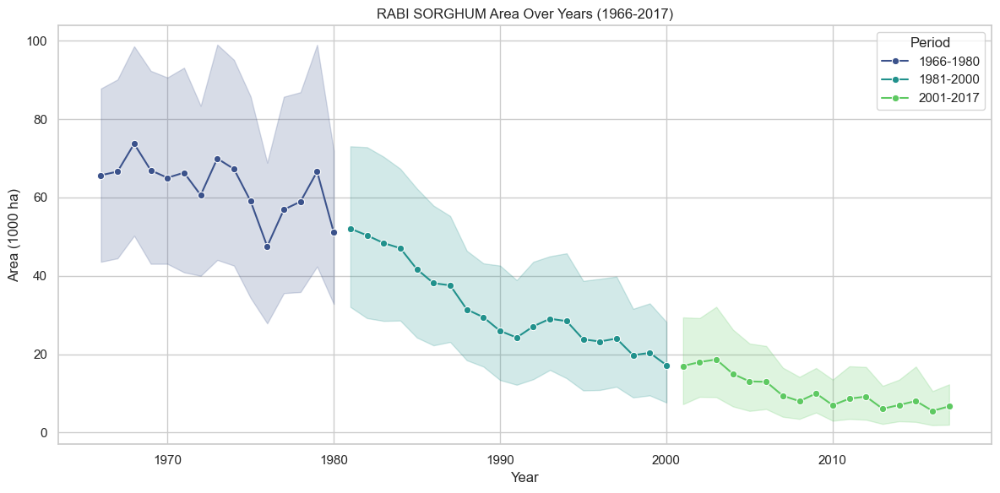

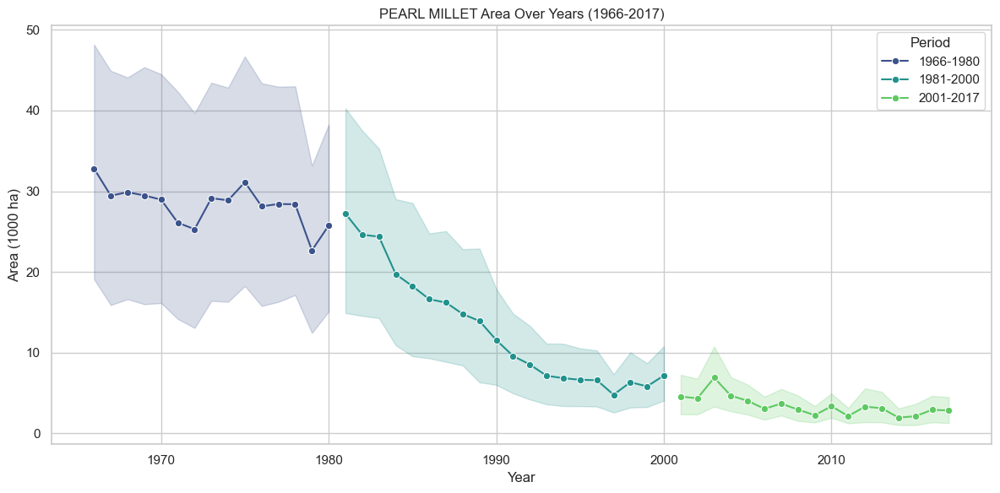

...

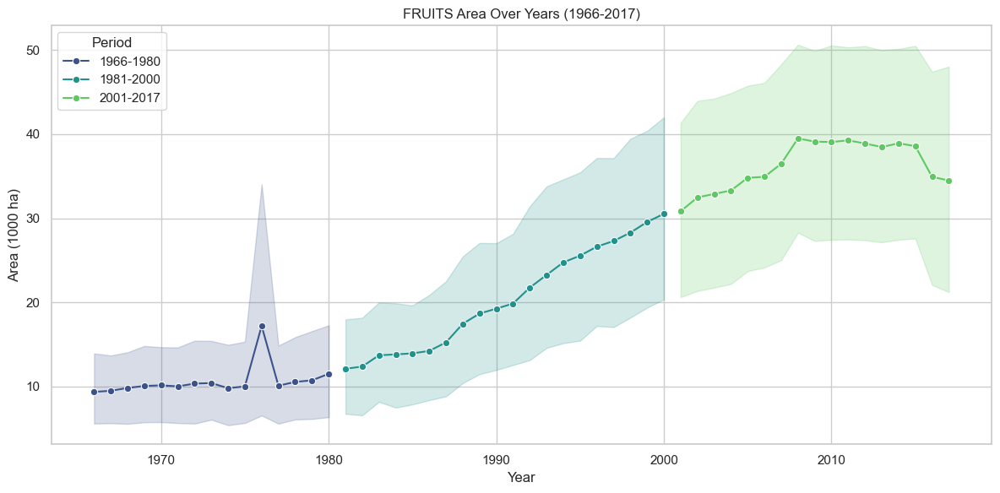

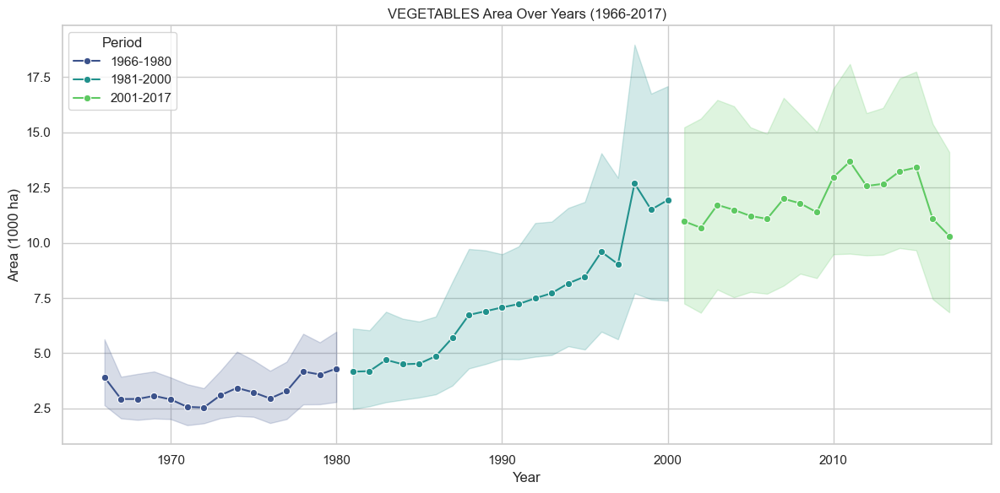

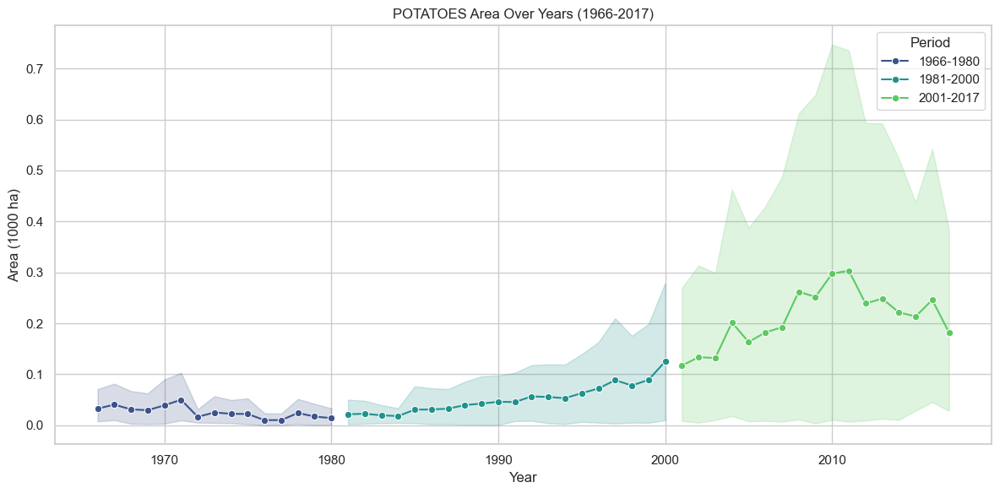

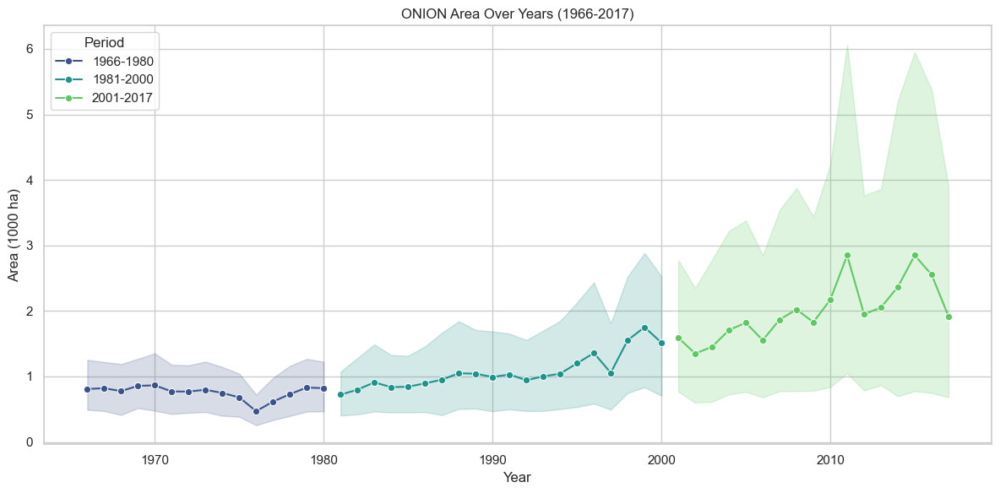

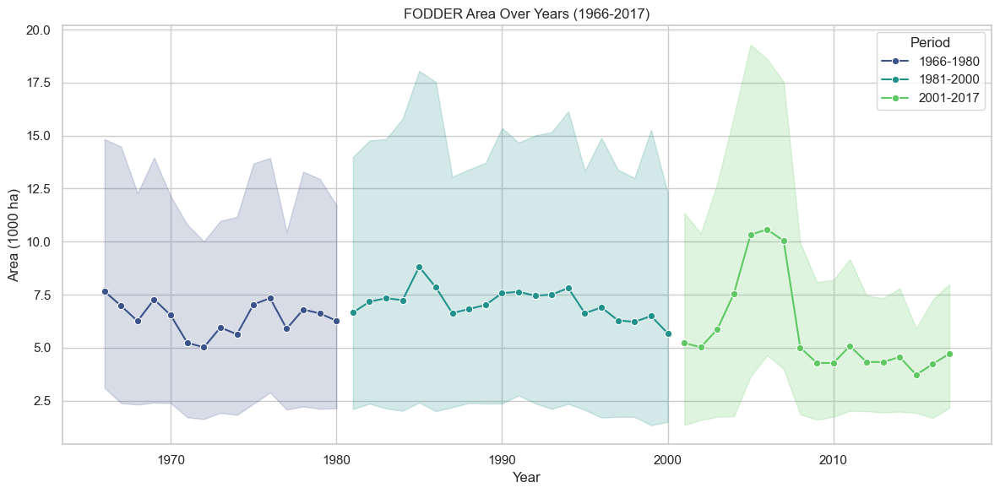

In [53]:
def assign_period(year):
    if 1966 <= year <= 1980:
        return '1966-1980'
    elif 1981 <= year <= 2000:
        return '1981-2000'
    elif 2001 <= year <= 2017:
        return '2001-2017'
    else:
        return 'Other'

df['Period'] = df['Year'].apply(assign_period)

main_crops = [
    'RICE', 'WHEAT', 'KHARIF SORGHUM', 'RABI SORGHUM', 'PEARL MILLET', 'MAIZE', 
    'FINGER MILLET', 'BARLEY', 'CHICKPEA', 'PIGEONPEA', 'MINOR PULSES', 
    'GROUNDNUT', 'SESAMUM', 'RAPESEED AND MUSTARD', 'SAFFLOWER', 'CASTOR', 
    'LINSEED', 'SUNFLOWER', 'SOYABEAN', 'OILSEEDS', 'SUGARCANE', 'COTTON', 
    'FRUITS', 'VEGETABLES', 'POTATOES', 'ONION', 'FODDER'
]

for crop in main_crops:
    area_col = f"{crop} AREA (1000 ha)"
    
    if area_col in df.columns:
        plt.figure(figsize=(12,6))
        sns.lineplot(data=df, x='Year', y=area_col, hue='Period', marker='o', palette='viridis')
        plt.title(f'{crop} Area Over Years (1966-2017)')
        plt.xlabel('Year')
        plt.ylabel('Area (1000 ha)')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

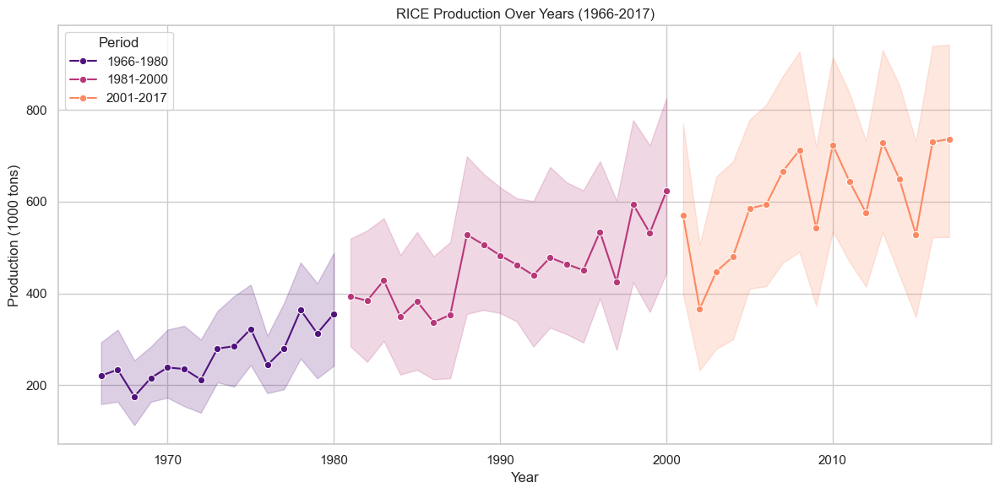

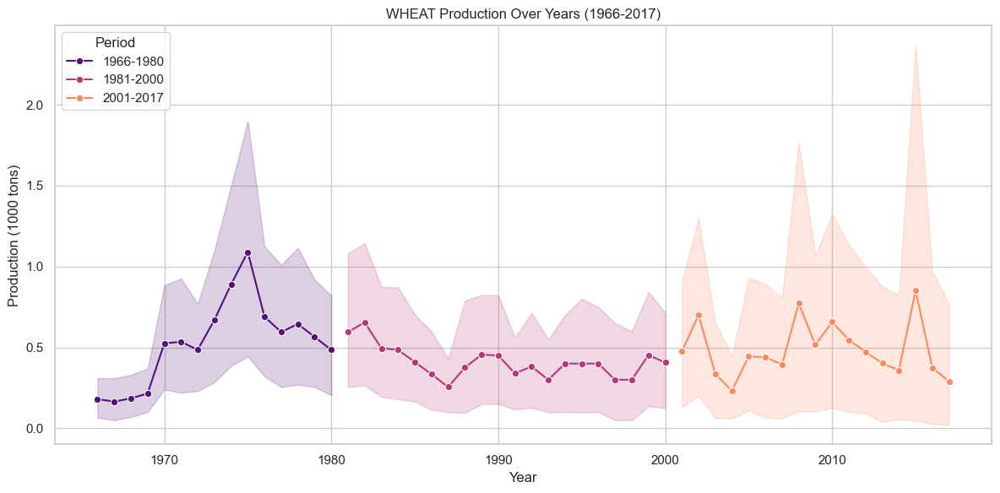

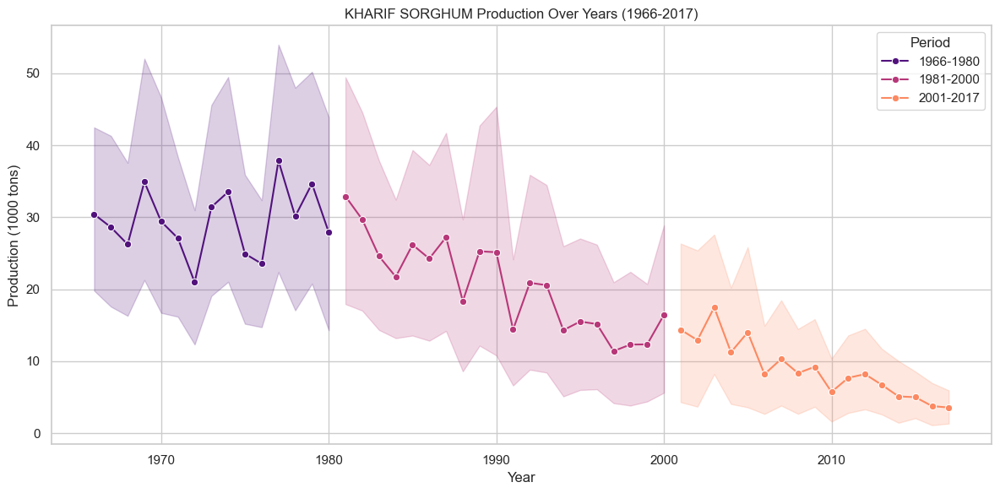

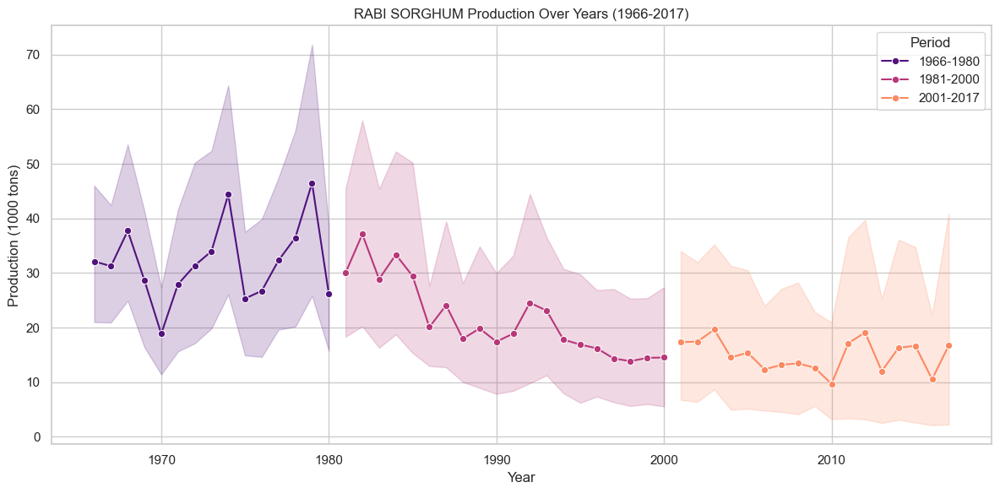

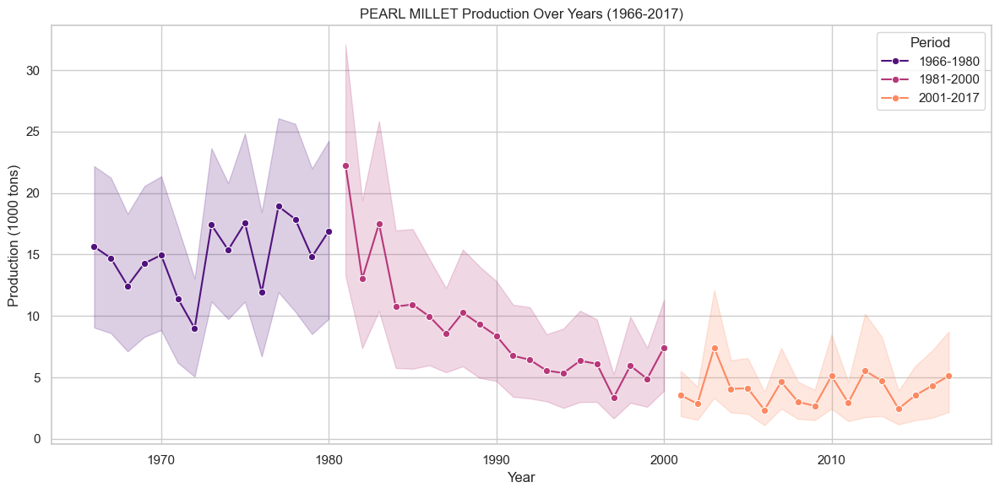

...

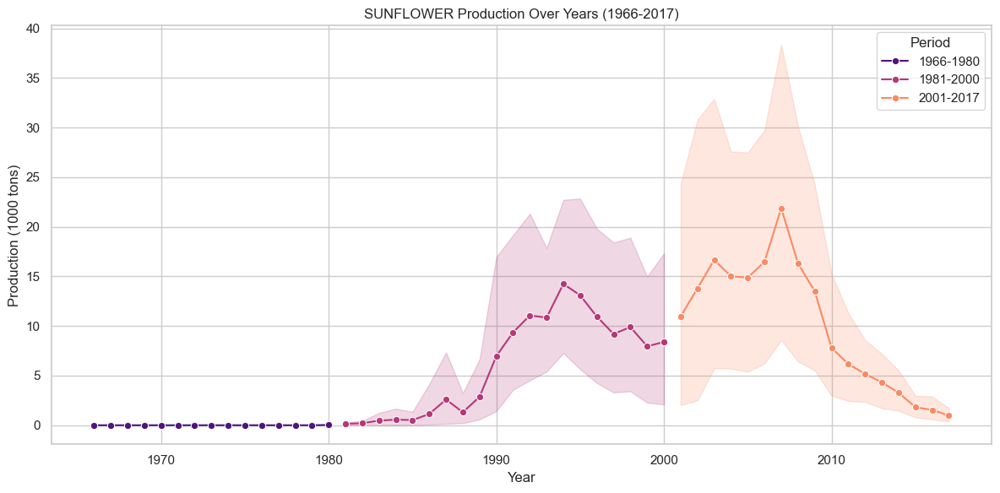

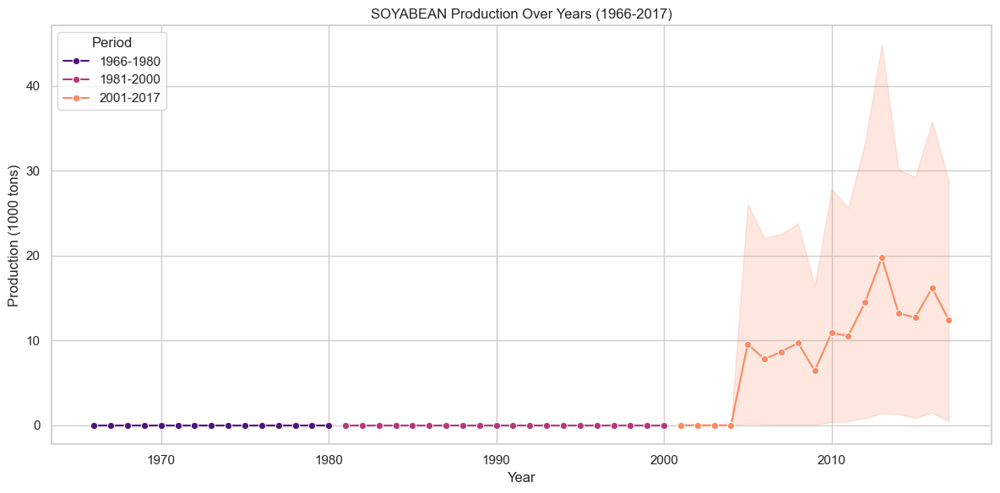

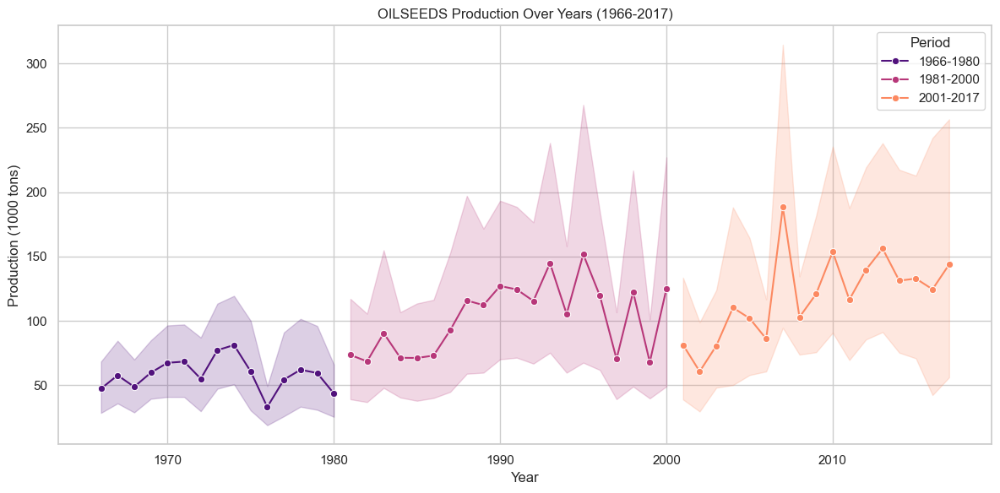

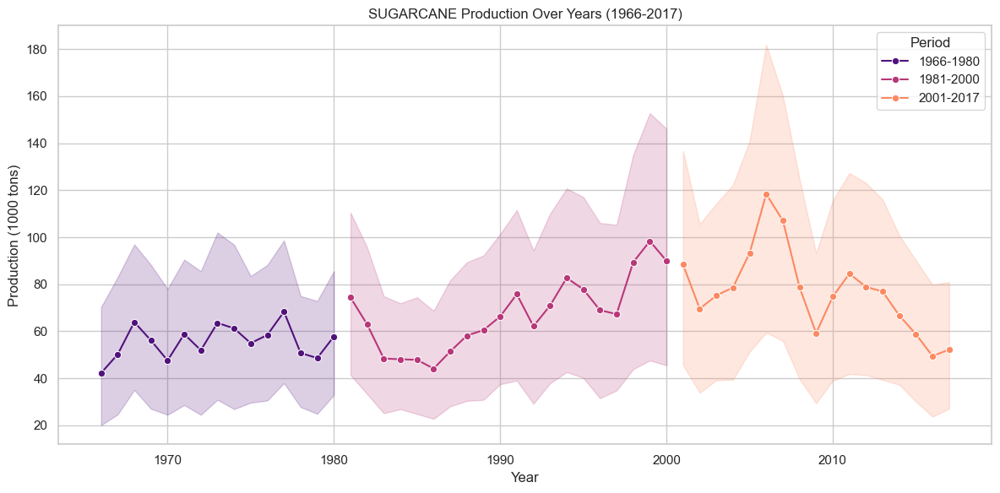

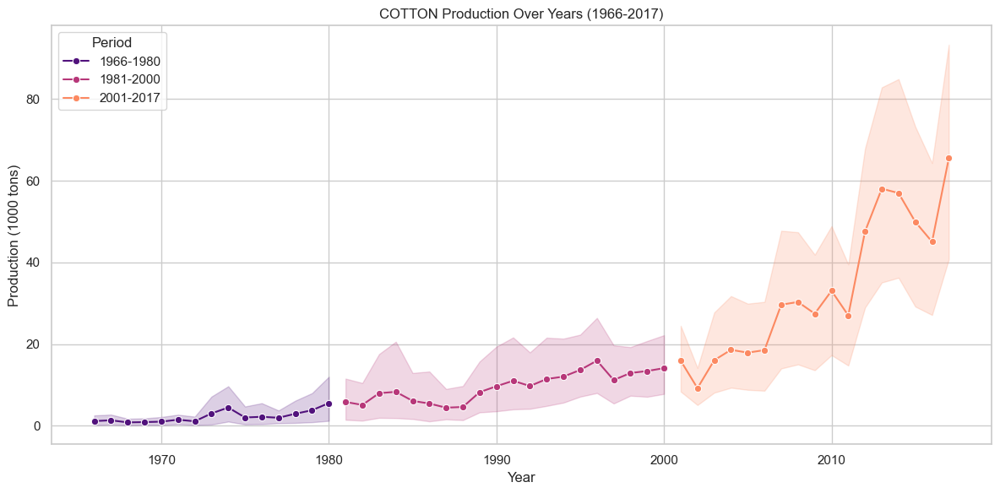

In [54]:
for crop in main_crops:
    production_col = f"{crop} PRODUCTION (1000 tons)"
    
    if production_col in df.columns:
        plt.figure(figsize=(12,6))
        sns.lineplot(data=df, x='Year', y=production_col, hue='Period', marker='o', palette='magma')
        plt.title(f'{crop} Production Over Years (1966-2017)')
        plt.xlabel('Year')
        plt.ylabel('Production (1000 tons)')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


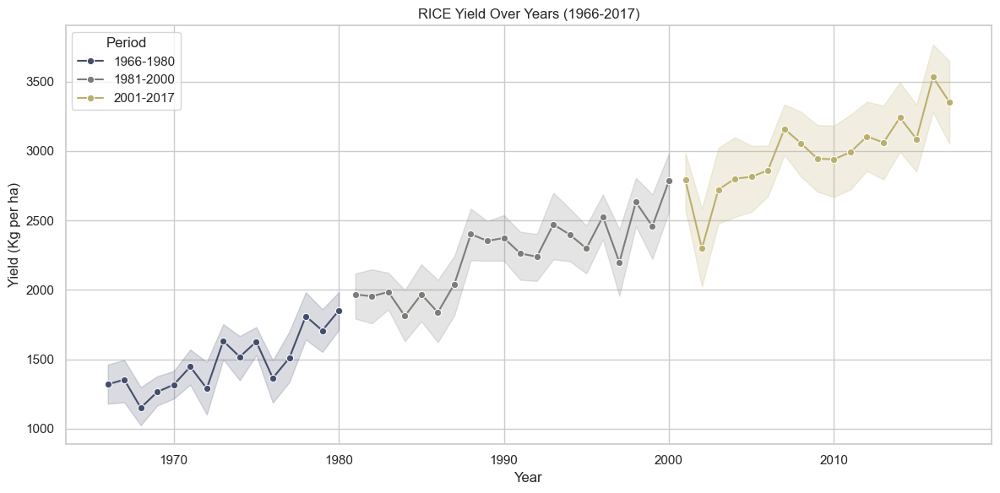

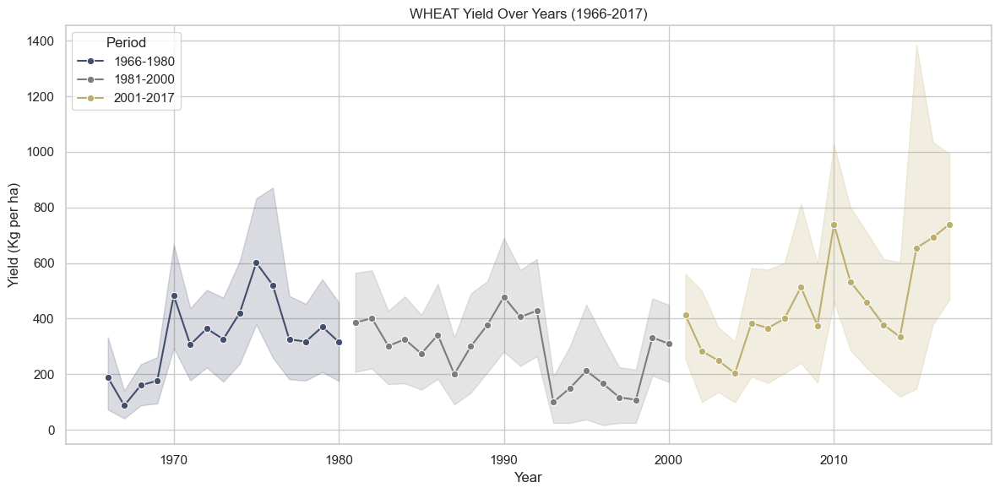

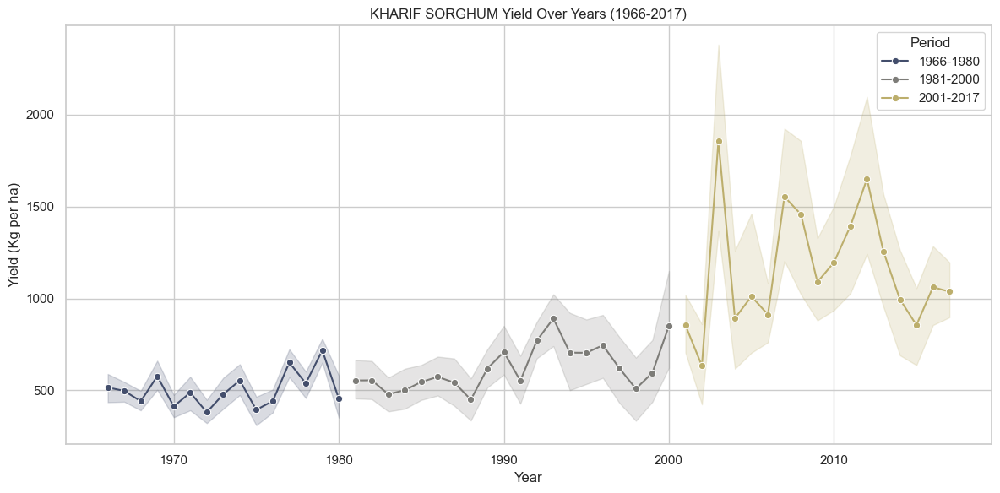

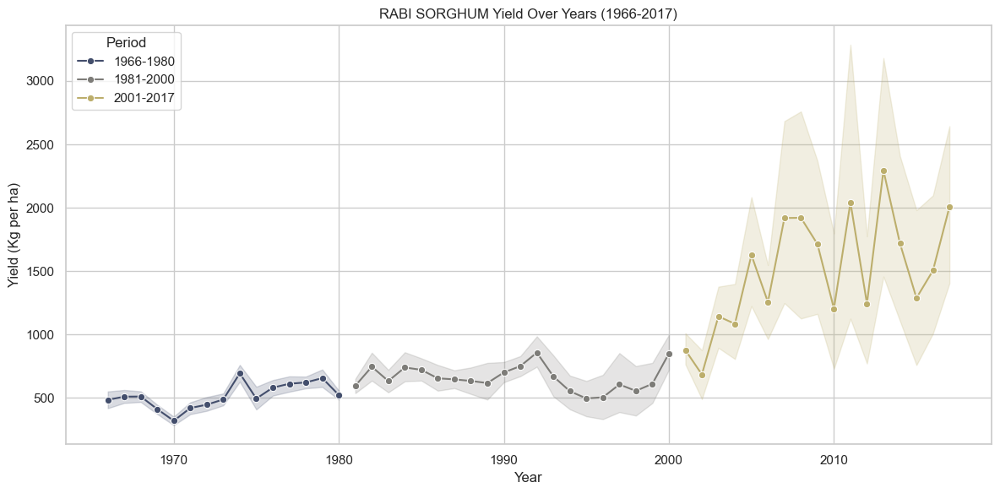

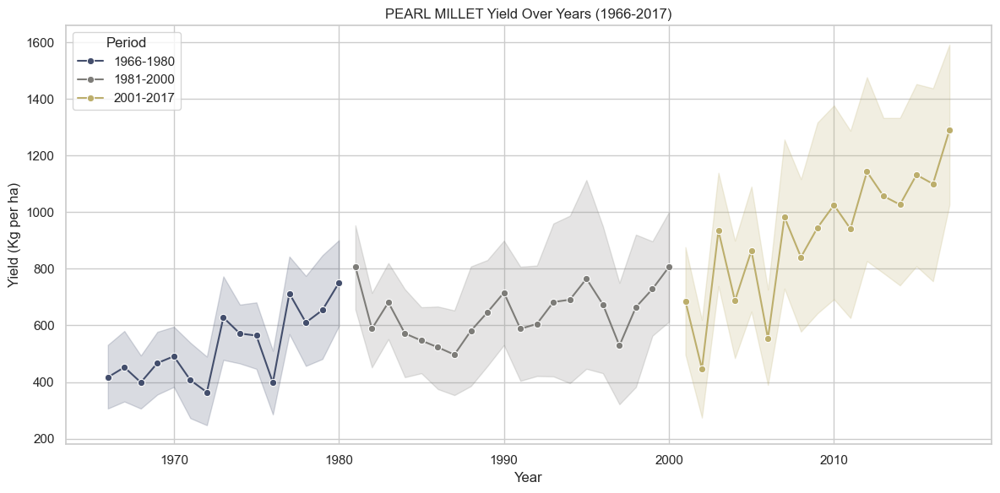

...

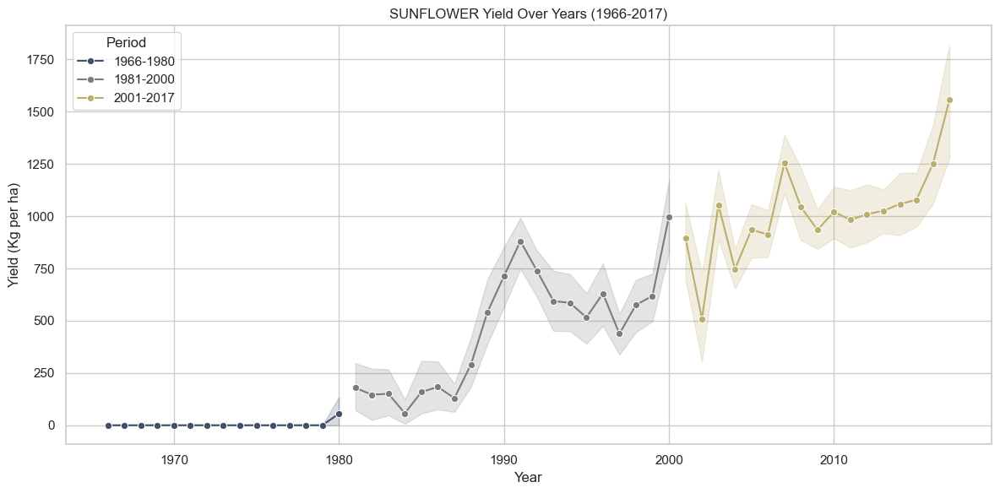

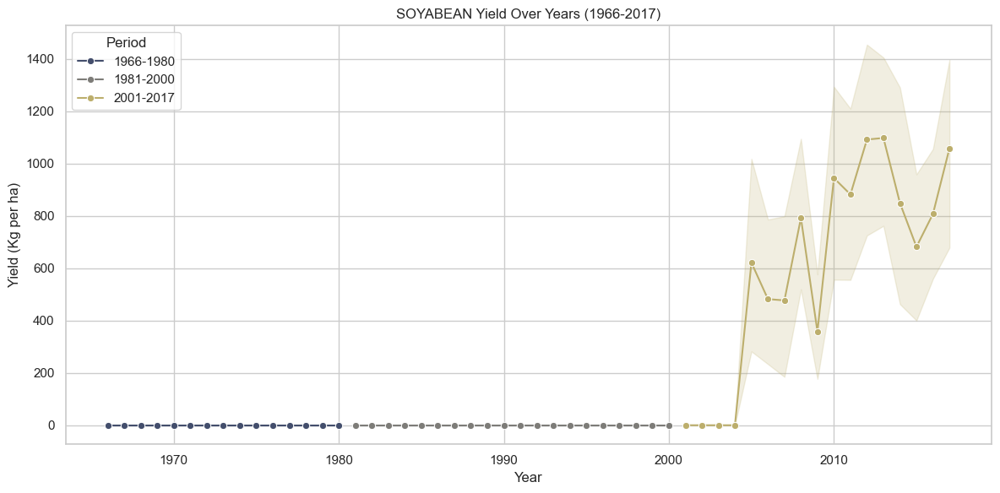

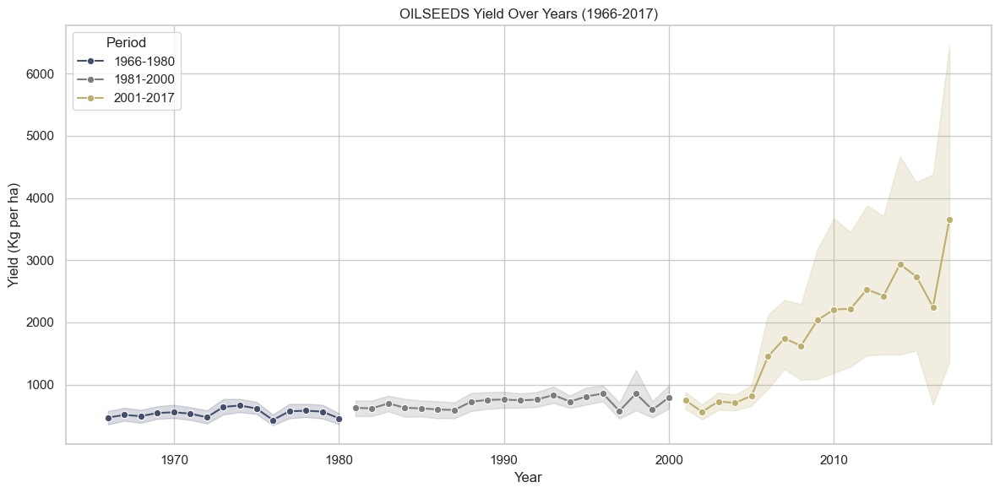

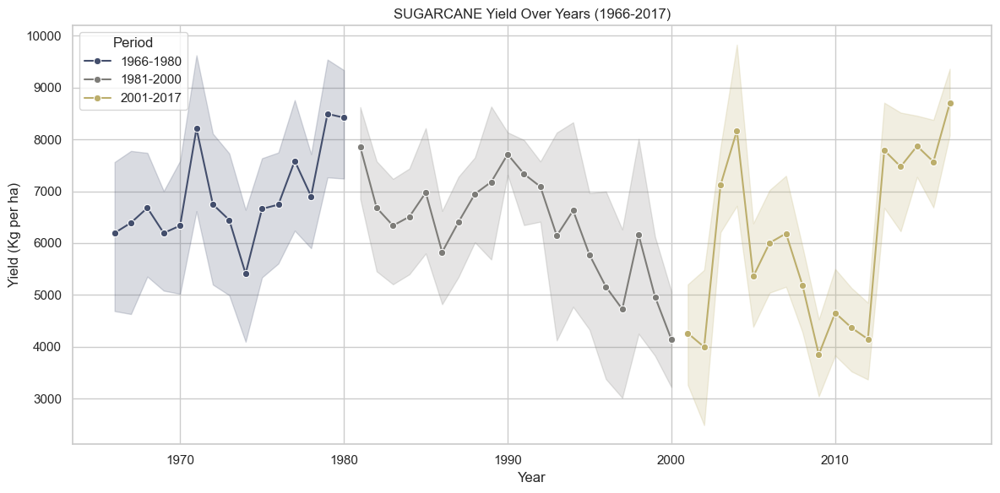

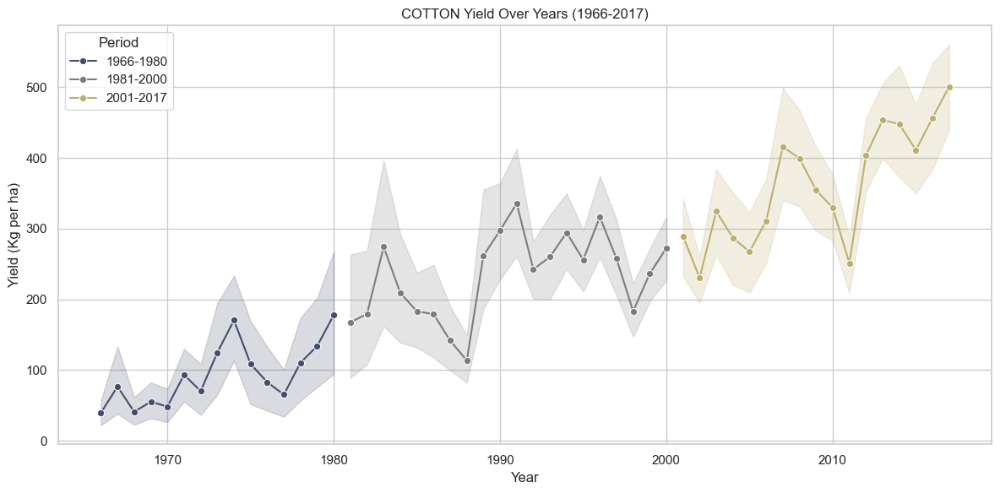

In [55]:
for crop in main_crops:
    yield_col = f"{crop} YIELD (Kg per ha)"
    
    if yield_col in df.columns:
        plt.figure(figsize=(12,6))
        sns.lineplot(data=df, x='Year', y=yield_col, hue='Period', marker='o', palette='cividis')
        plt.title(f'{crop} Yield Over Years (1966-2017)')
        plt.xlabel('Year')
        plt.ylabel('Yield (Kg per ha)')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


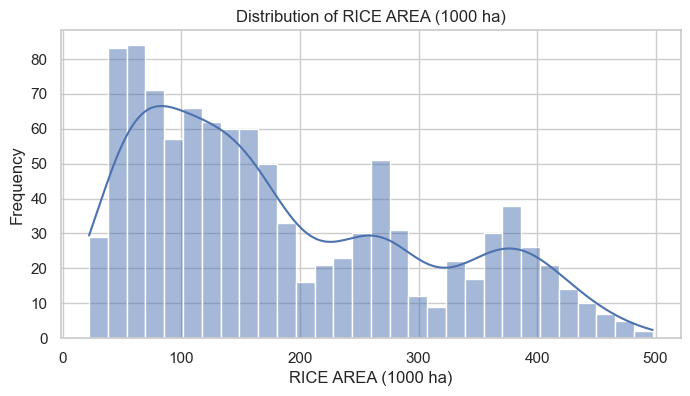

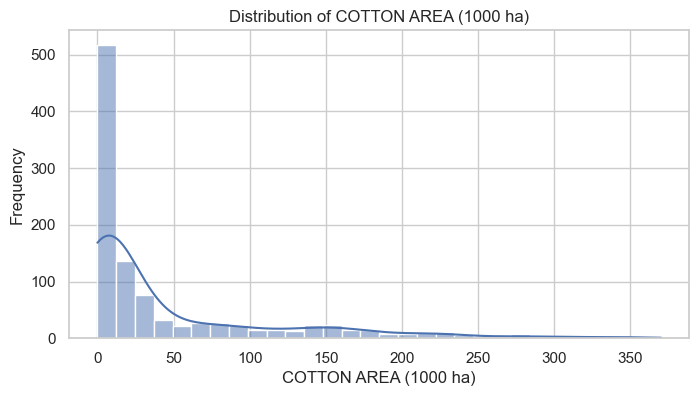

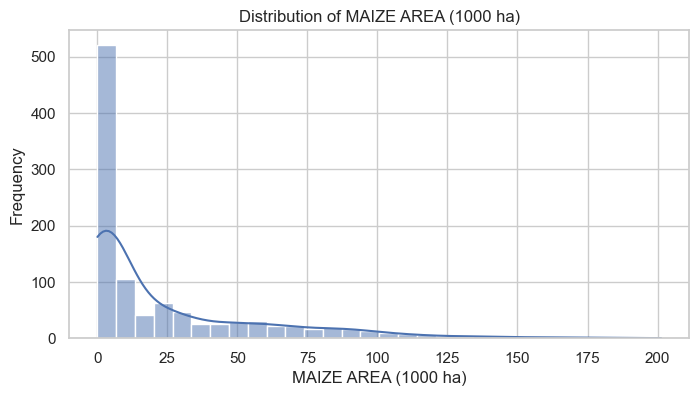

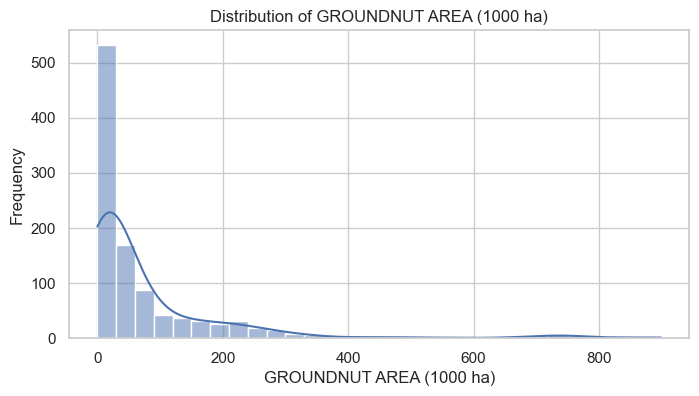

In [56]:
# single columns
crops_to_check = ['RICE AREA (1000 ha)', 'COTTON AREA (1000 ha)', 'MAIZE AREA (1000 ha)', 'GROUNDNUT AREA (1000 ha)']

for crop in crops_to_check:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[crop], kde=True, bins=30)
    plt.title(f'Distribution of {crop}')
    plt.xlabel(crop)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()


Latest Year: 2017


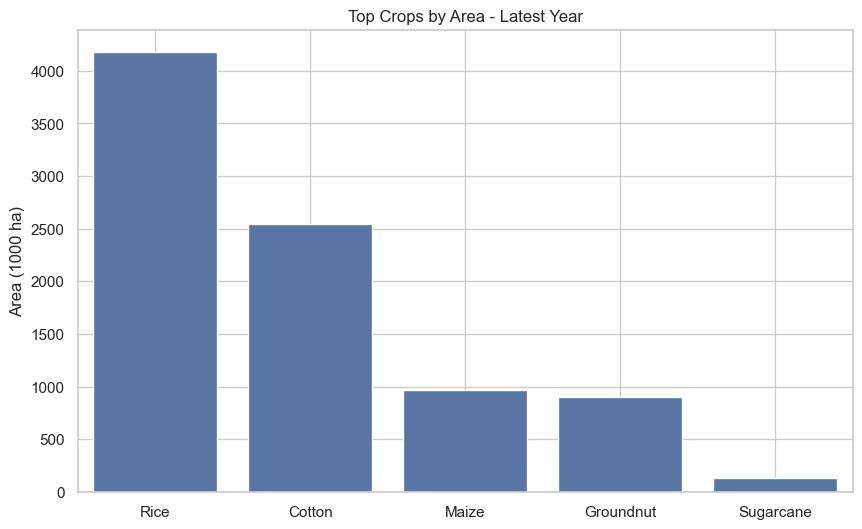

In [57]:
latest_year = df['Year'].max()
print(f"Latest Year: {latest_year}")

latest_data = df[df['Year'] == latest_year]

top_crops_area = {
    'Rice': latest_data['RICE AREA (1000 ha)'].sum(),
    'Cotton': latest_data['COTTON AREA (1000 ha)'].sum(),
    'Maize': latest_data['MAIZE AREA (1000 ha)'].sum(),
    'Groundnut': latest_data['GROUNDNUT AREA (1000 ha)'].sum(),
    'Sugarcane': latest_data['SUGARCANE AREA (1000 ha)'].sum(),
}

# Bar Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=list(top_crops_area.keys()), y=list(top_crops_area.values()))
plt.title('Top Crops by Area - Latest Year')
plt.ylabel('Area (1000 ha)')
plt.grid(True)
plt.show()


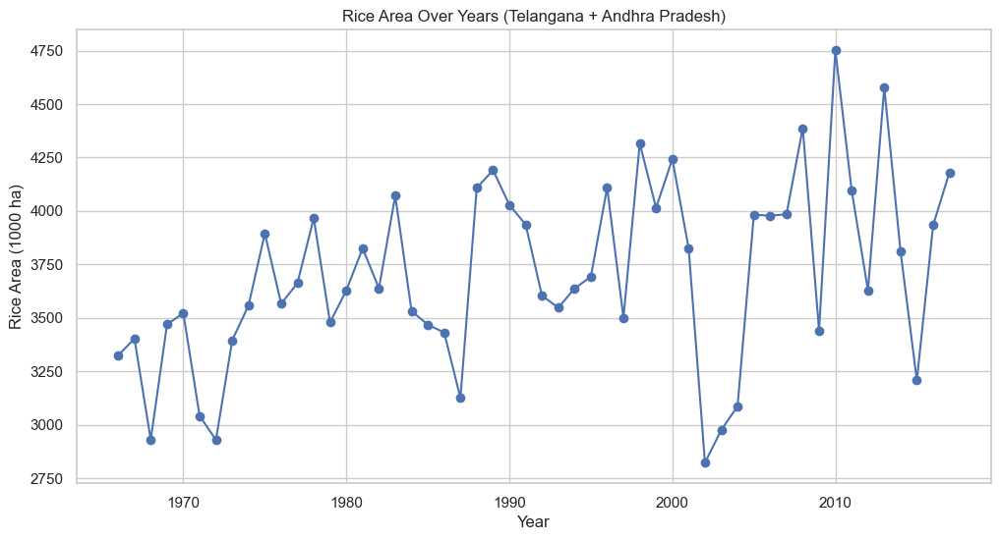

In [58]:
# Group rice area by year
rice_area_trend = df.groupby('Year')['RICE AREA (1000 ha)'].sum()

plt.figure(figsize=(12,6))
rice_area_trend.plot(marker='o')
plt.title('Rice Area Over Years (Telangana + Andhra Pradesh)')
plt.xlabel('Year')
plt.ylabel('Rice Area (1000 ha)')
plt.grid(True)
plt.show()


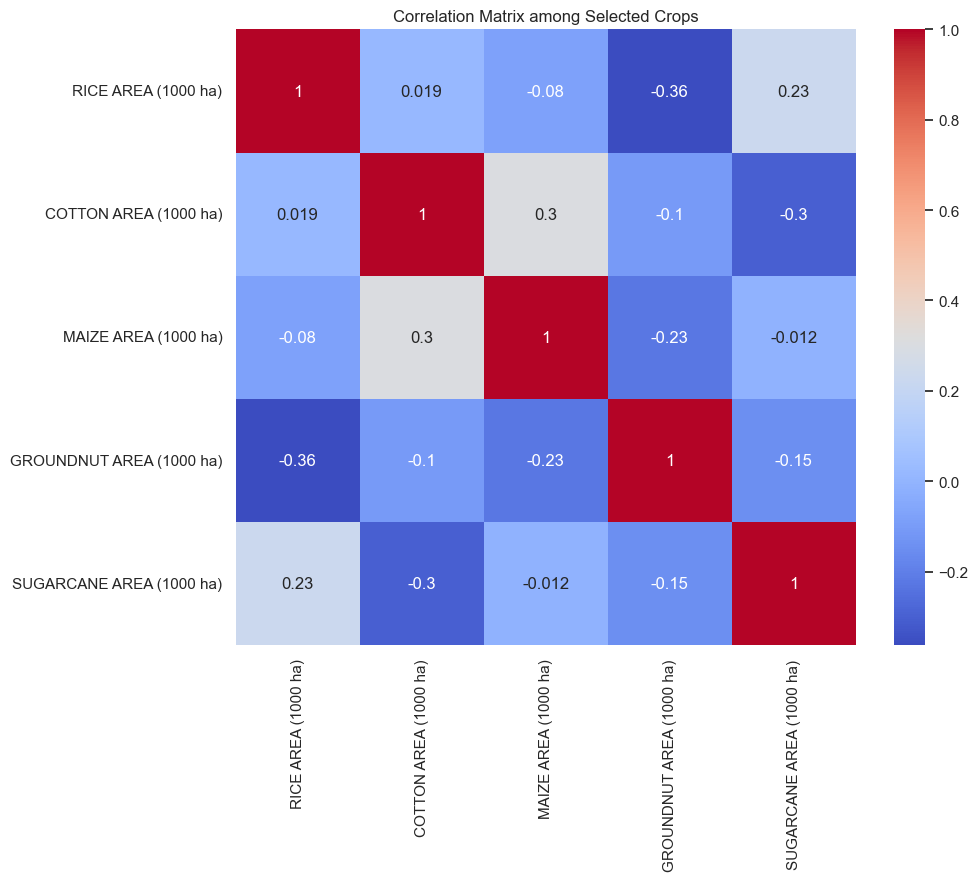

In [59]:
# corelational analysis
selected_columns = [
    'RICE AREA (1000 ha)', 
    'COTTON AREA (1000 ha)', 
    'MAIZE AREA (1000 ha)', 
    'GROUNDNUT AREA (1000 ha)', 
    'SUGARCANE AREA (1000 ha)'
]

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df[selected_columns].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix among Selected Crops')
plt.show()


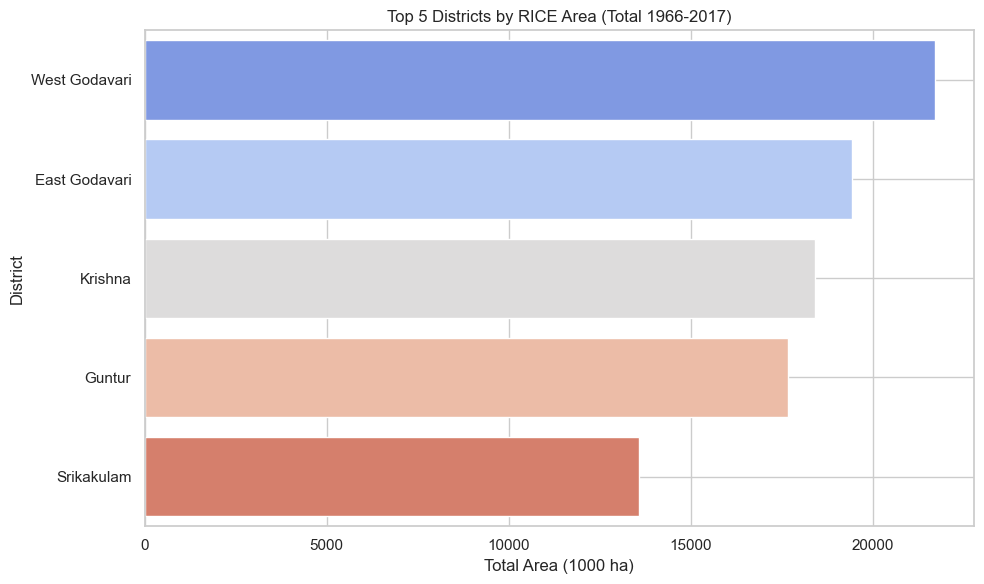

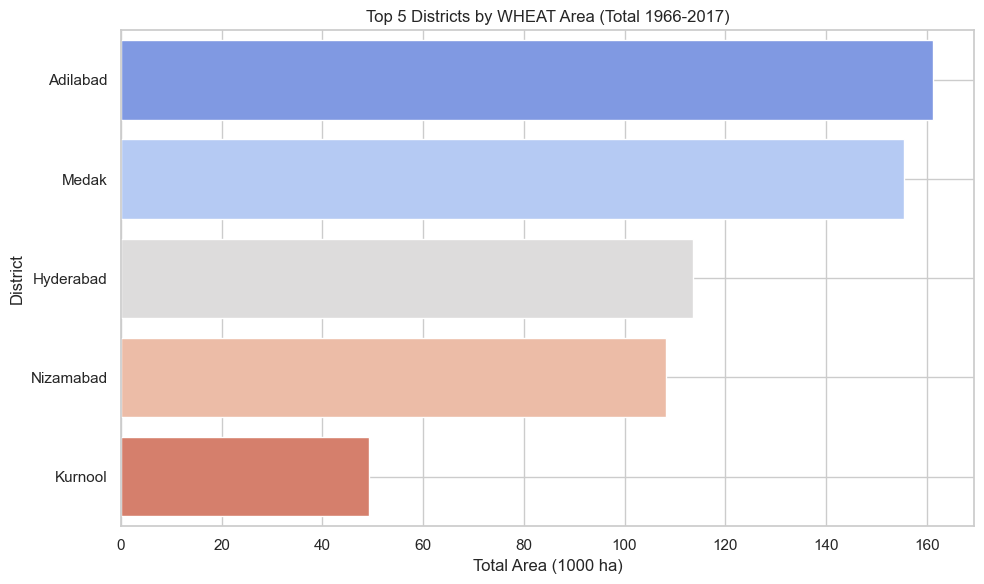

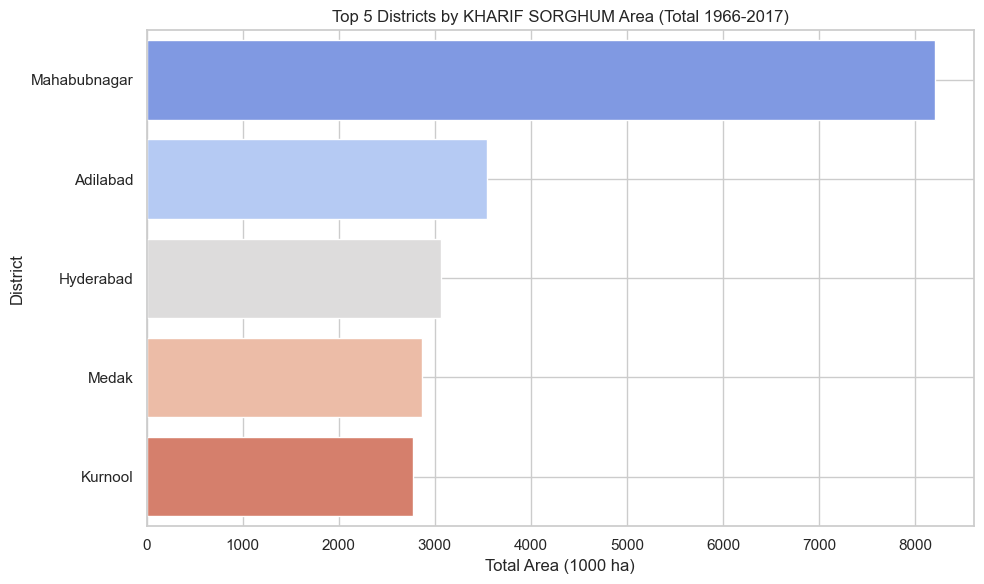

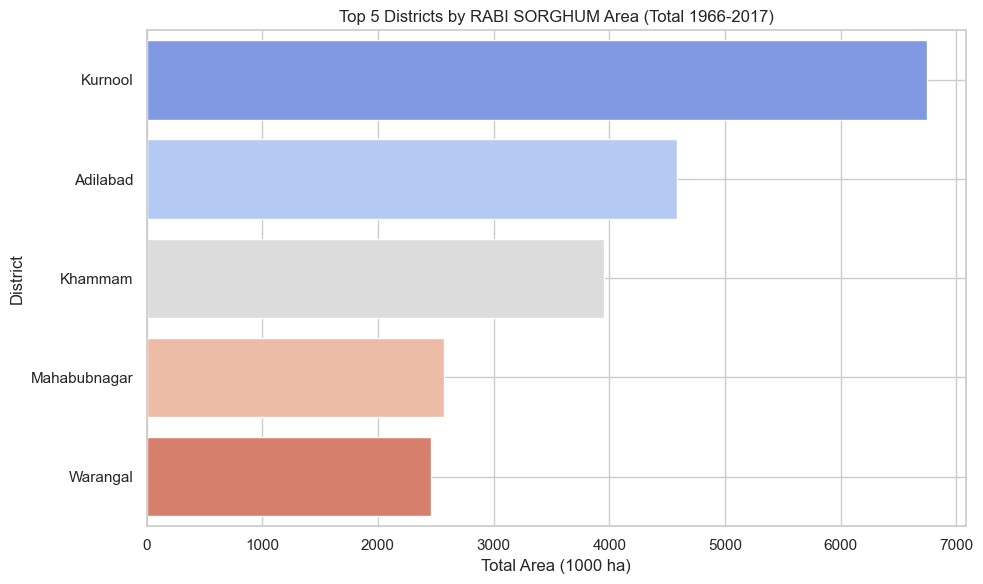

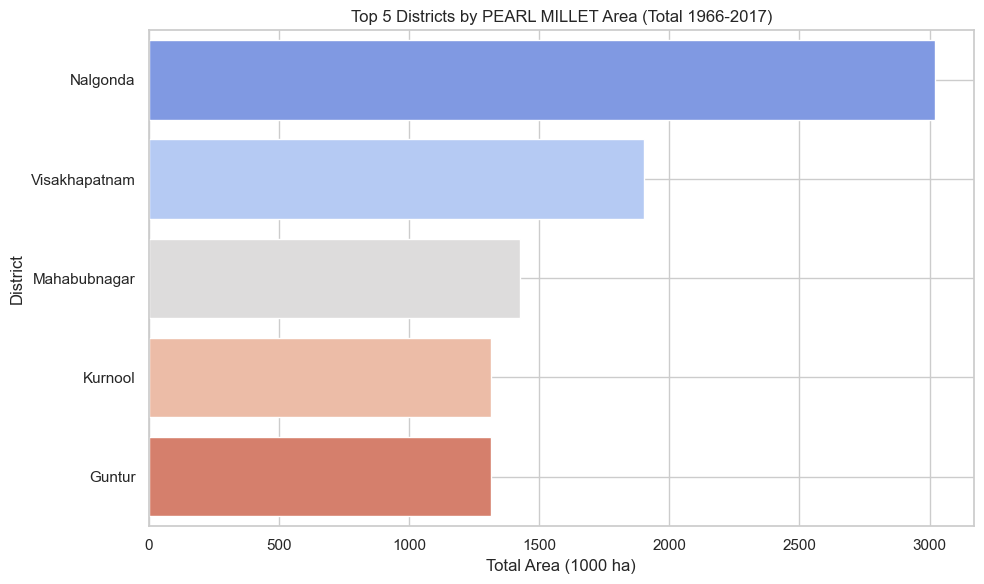

...

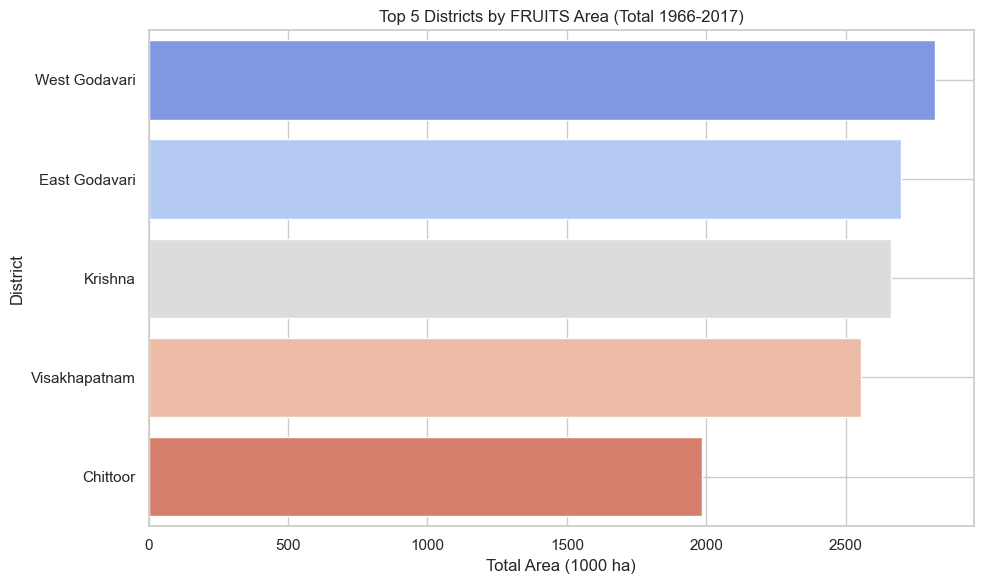

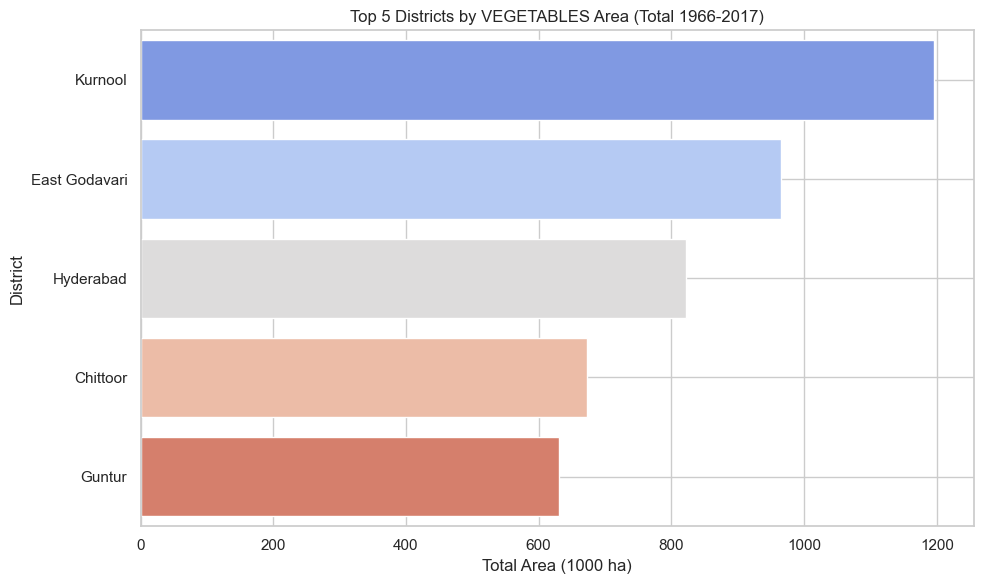

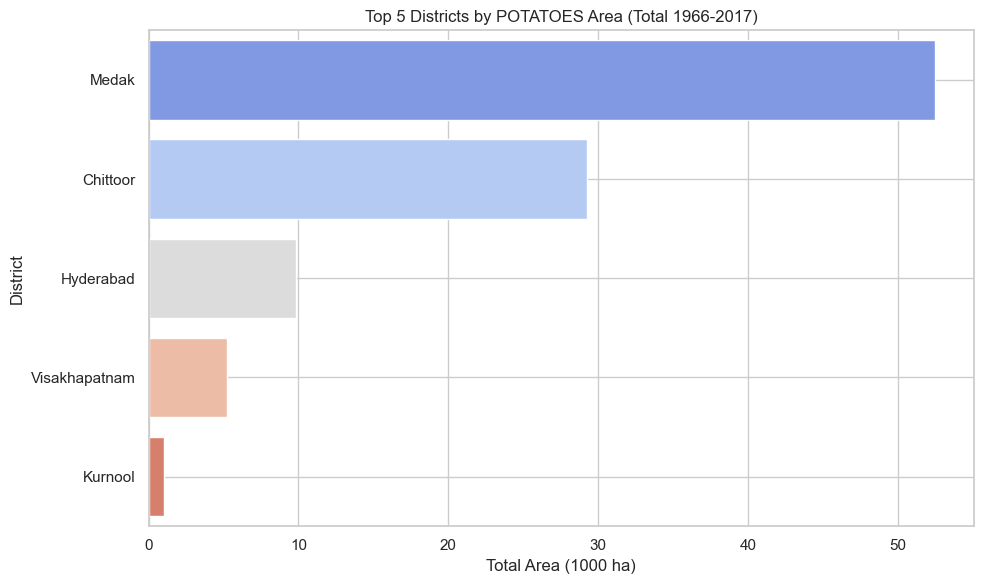

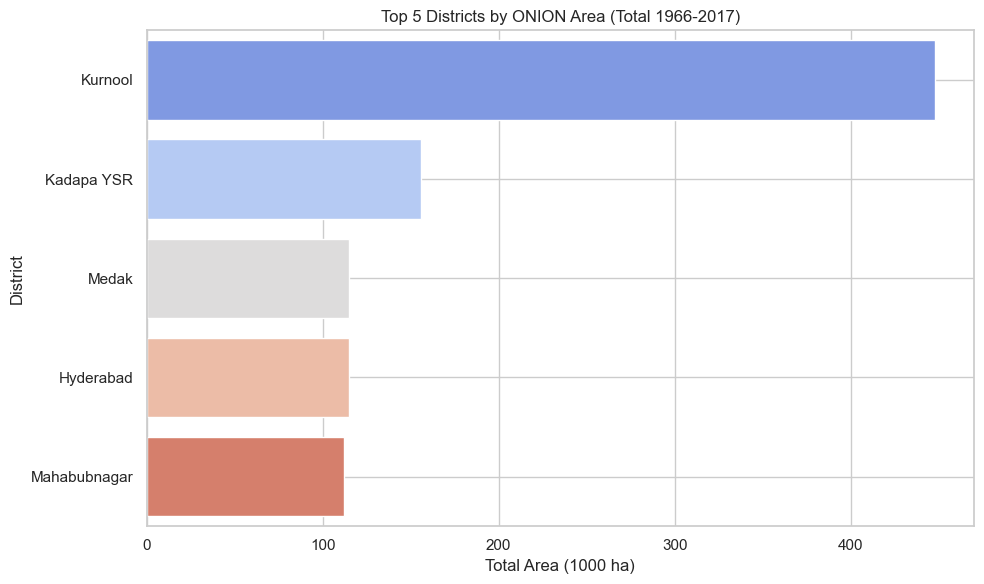

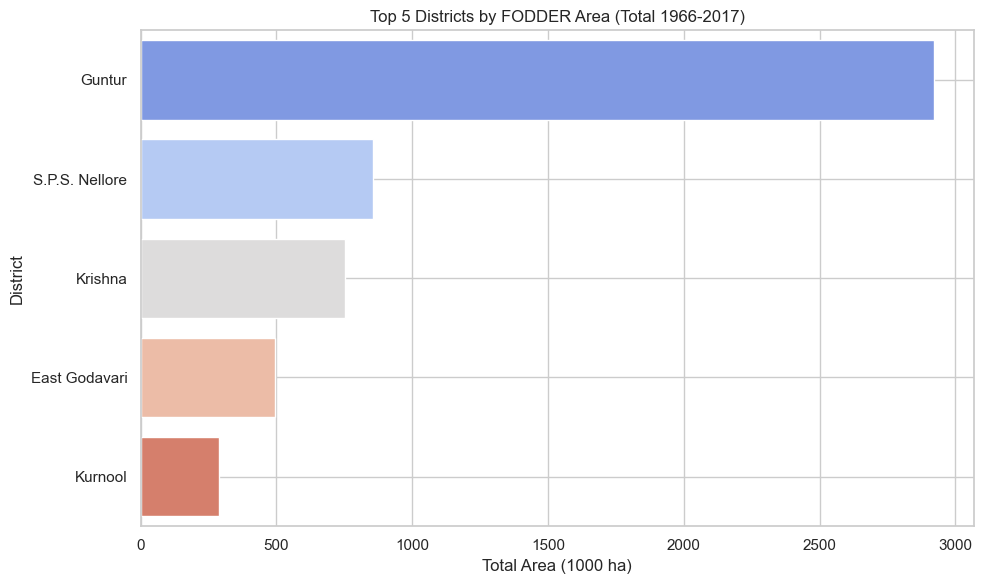

In [60]:

for crop in main_crops:
    area_col = f"{crop} AREA (1000 ha)"
    
    if area_col in df.columns:
        top_districts = df.groupby('Dist Name')[area_col].sum().sort_values(ascending=False).head(5)
        
        plt.figure(figsize=(10,6))
        sns.barplot(x=top_districts.values, y=top_districts.index, hue=top_districts.index, dodge=False, palette='coolwarm', legend=False)
        plt.title(f'Top 5 Districts by {crop} Area (Total 1966-2017)')
        plt.xlabel('Total Area (1000 ha)')
        plt.ylabel('District')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


Telangana and AP seperate

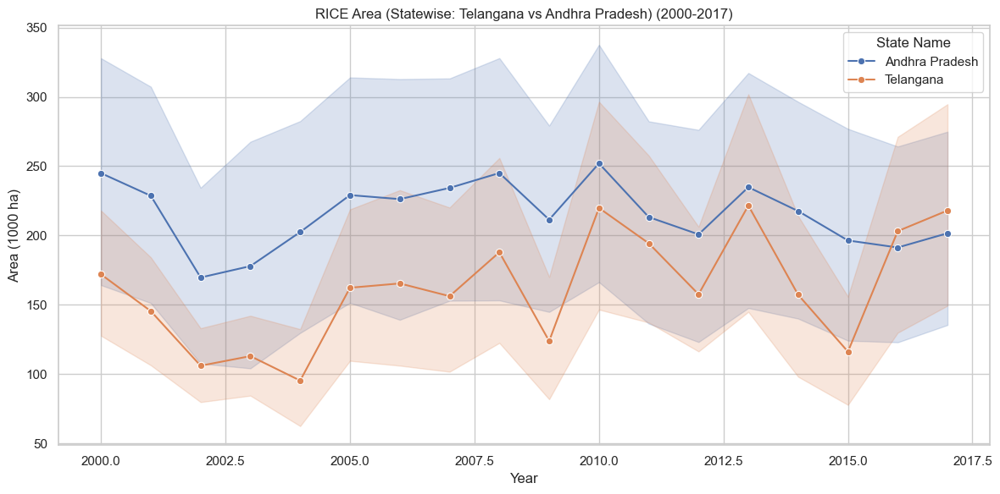

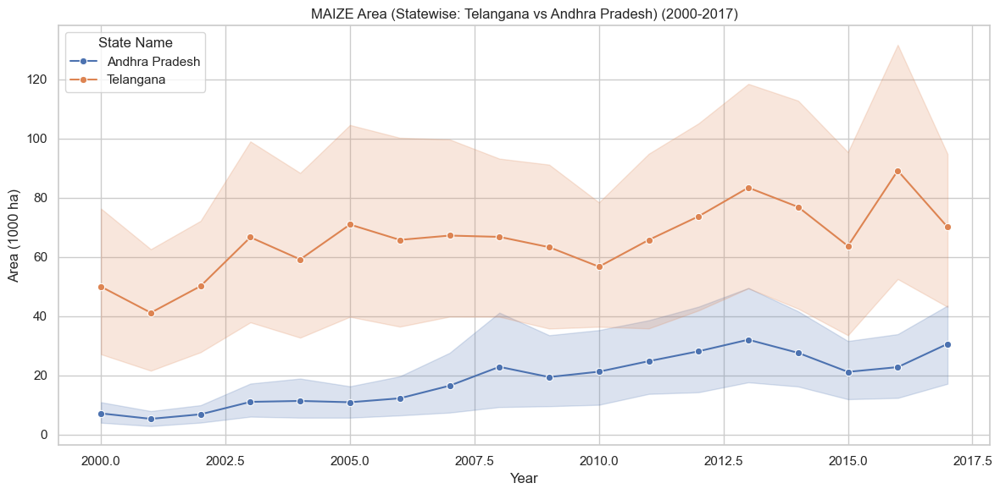

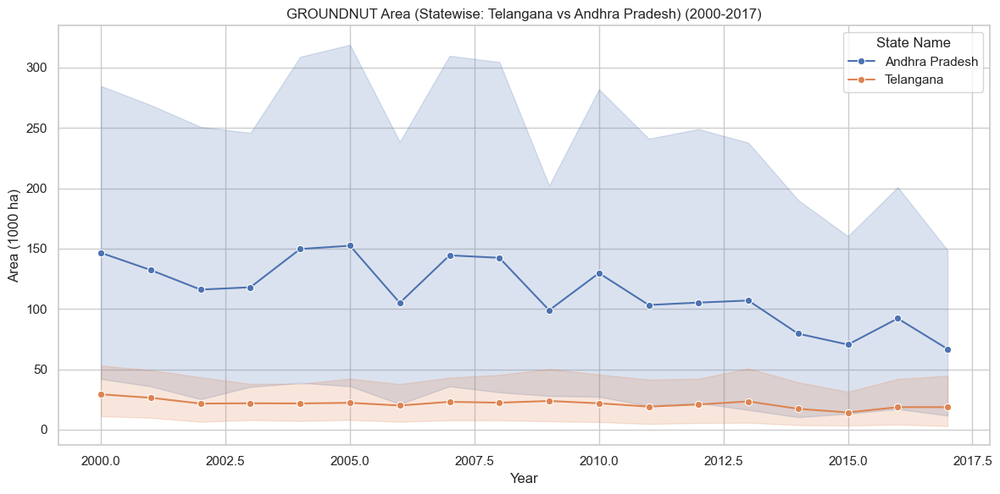

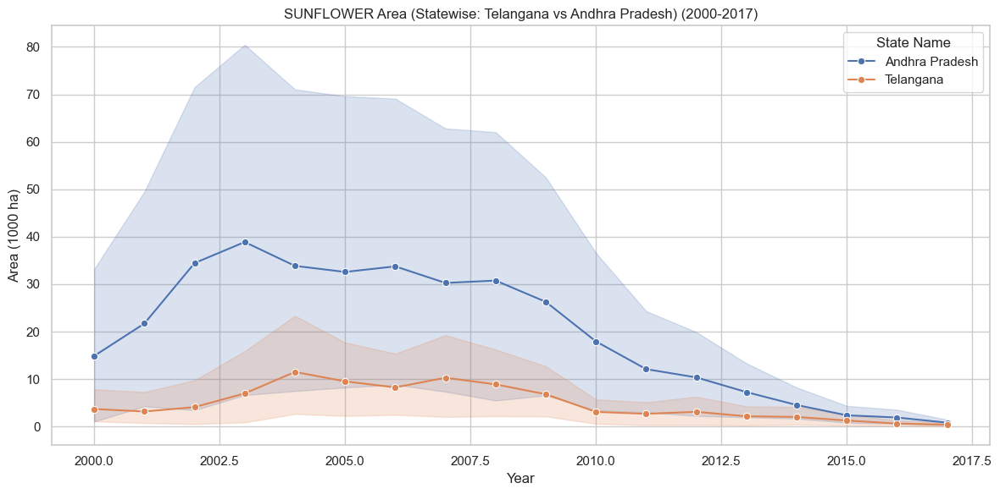

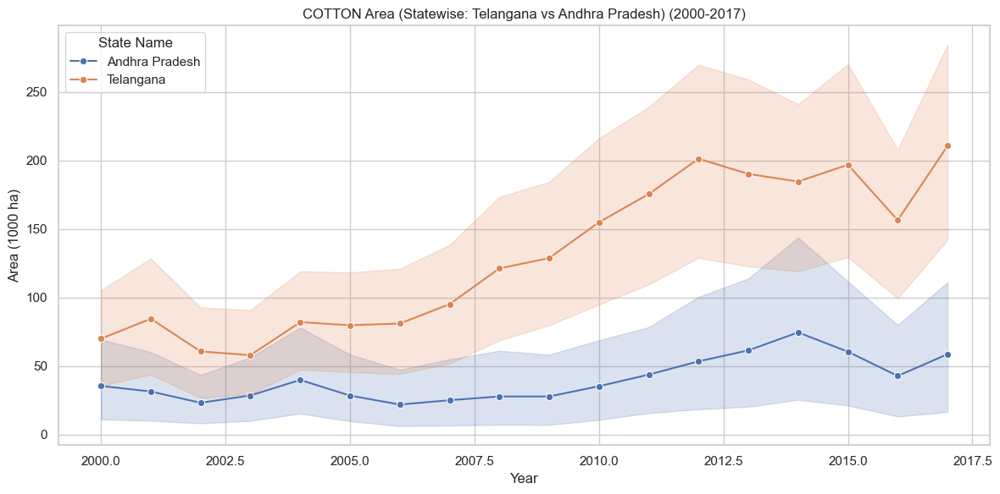

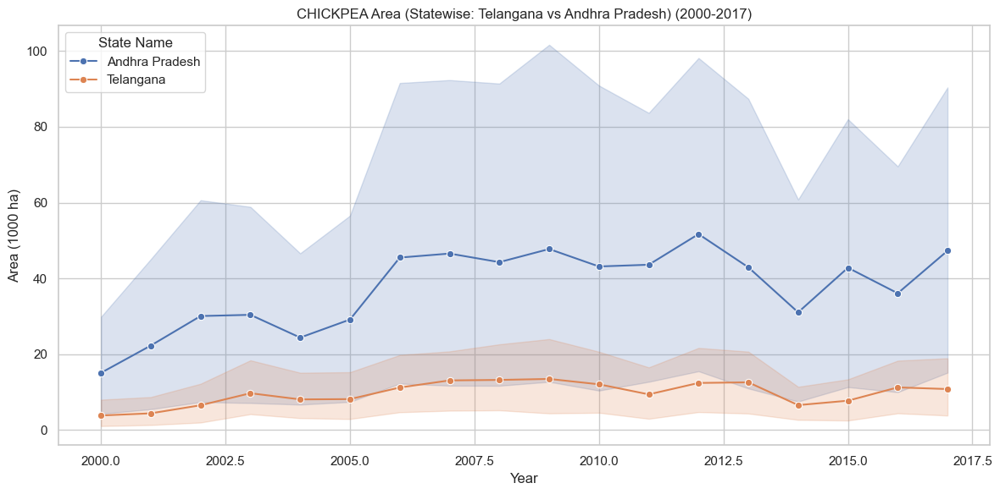

In [61]:
def assign_period(year):
    if 1966 <= year <= 1980:
        return '1966-1980'
    elif 1981 <= year <= 2000:
        return '1981-2000'
    elif 2001 <= year <= 2017:
        return '2001-2017'
    else:
        return 'Other'

df['Period'] = df['Year'].apply(assign_period)

# Important Crops
main_crops = [
    'RICE', 'MAIZE', 'GROUNDNUT', 'SUNFLOWER', 'COTTON', 'CHICKPEA'
]

# Statewise Time Trends for Key Crops
for crop in main_crops:
    area_col = f"{crop} AREA (1000 ha)"
    
    if area_col in df.columns:
        plt.figure(figsize=(12,6))
        sns.lineplot(data=df[df['Year']>=2000], x='Year', y=area_col, hue='State Name', marker='o')
        plt.title(f'{crop} Area (Statewise: Telangana vs Andhra Pradesh) (2000-2017)')
        plt.xlabel('Year')
        plt.ylabel('Area (1000 ha)')
        plt.grid(True)
        plt.tight_layout()
        plt.show()

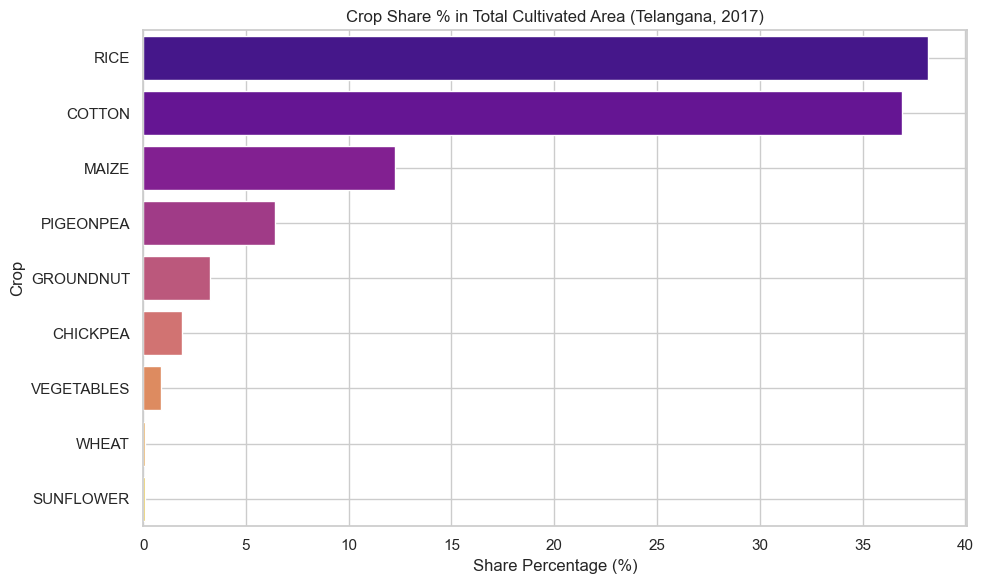

In [62]:
# telangana crop domination
plt.figure(figsize=(10,6))
sns.barplot(
    x='Share %',
    y='Crop',
    hue='Crop',               # ➔ Add hue
    data=crop_area_df.sort_values(by='Share %', ascending=False),
    palette='plasma',
    dodge=False,              
    legend=False            
)
plt.title('Crop Share % in Total Cultivated Area (Telangana, 2017)')
plt.xlabel('Share Percentage (%)')
plt.ylabel('Crop')
plt.grid(True)
plt.tight_layout()
plt.show()


Prediction for 

Predicted Rice Area in Telangana for 2025: 188.17 (1000 ha)


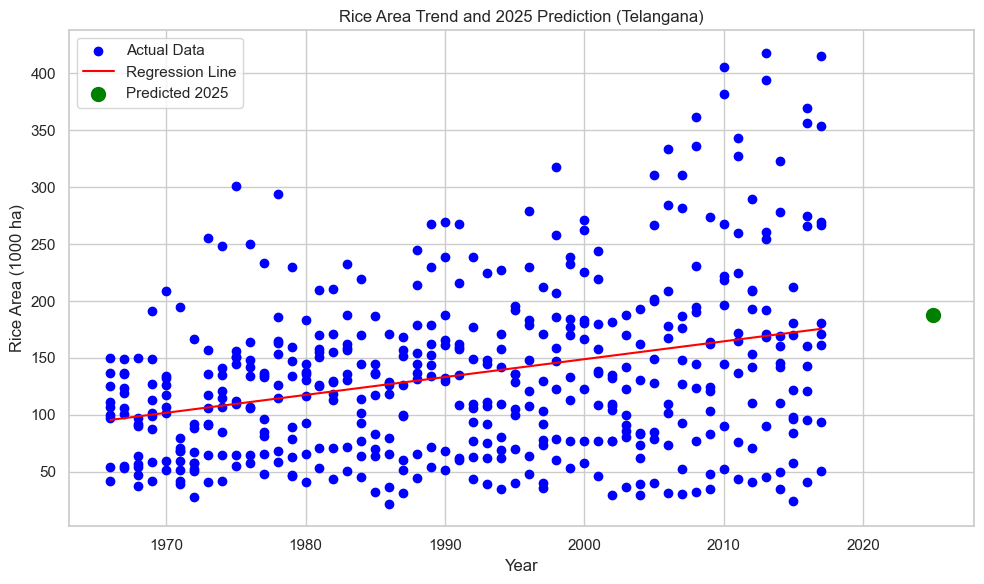

In [63]:
from sklearn.linear_model import LinearRegression

telangana_df = df[df['State Name'] == 'Telangana']

rice_data = telangana_df[['Year', 'RICE AREA (1000 ha)']].dropna()

X = rice_data['Year'].values.reshape(-1,1)
y = rice_data['RICE AREA (1000 ha)'].values

model = LinearRegression()
model.fit(X, y)

year_to_predict = np.array([[2025]])
predicted_area = model.predict(year_to_predict)

print(f"Predicted Rice Area in Telangana for 2025: {predicted_area[0]:.2f} (1000 ha)")

plt.figure(figsize=(10,6))
plt.scatter(X, y, color='blue', label='Actual Data')
plt.plot(X, model.predict(X), color='red', label='Regression Line')
plt.scatter(2025, predicted_area, color='green', s=100, label='Predicted 2025')
plt.title('Rice Area Trend and 2025 Prediction (Telangana)')
plt.xlabel('Year')
plt.ylabel('Rice Area (1000 ha)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()